In [1]:
print('hello world')

import pandas as pd
import numpy as np
import matplotlib as mpl

#This changes the fonts in matplotlib .pdf outputs to be compatible with abdobe illustrator
mpl.rcParams['pdf.fonttype'] = 42

import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import scipy.stats as stats
import statsmodels.stats.multitest as smt
from scipy.stats import gmean

from matplotlib.colors import ListedColormap

# Load FIJI LUT exported as CSV with columns: Index, Red, Green, Blue
df = pd.read_csv("LUT.csv")

# Create matplotlib colormap (RGB must be 0..1 floats)
rgb = df[["Red", "Green", "Blue"]].to_numpy() / 255.0
cmap = ListedColormap(rgb, name="fiji_hsi_hue")



import matplotlib as mpl
mpl.colormaps.register(cmap, name="fiji_hsi_hue", force=True)


#Read in the soluble dataset
df = pd.read_csv("103025_XH_DDA_SILAC_Soluble_SP-Mouse_Nested_NoNorm.csv")

#Read in insoluble dataset and merge only the datacolumns (those with substring 'Abundance: ') to the soluble dataframe
df_insoluble = pd.read_csv("103025_XH_DDA_SILAC_Insoluble_SP-Mouse_Nested_NoNorm.csv")

df_insoluble = df_insoluble[['Accession']+df_insoluble.filter(regex='Abundance: ').columns.to_list()]

df = pd.merge(df, df_insoluble, how='outer', on='Accession')

#Annotate with mitopaths and submitochondrial localization from mitocarta3
dfmc = pd.read_csv('Mouse.MitoCarta3.csv').rename(columns={'UniProt':'Accession'})

dfmc['MitoCarta3'] = True

df = pd.merge(df, dfmc[['Accession', 'MitoCarta3', 'MitoCarta3.0_SubMitoLocalization', 'MitoCarta3.0_MitoPathways']], how='left', on='Accession')

df.MitoCarta3 = df.MitoCarta3.fillna(False)


#Simplify the data columns names for the soluble and insoluble dataset
datacols = df.filter(regex='Abundance: ').columns.to_list()

newdatacols = [col.split(': ')[2].split(', ')[0]+'_'+col.split(': ')[2].split(', ')[3]+'_'+col.split(': ')[2].split(', ')[4] for col in datacols]

newdatacols = [col.replace('S59L-', '') for col in newdatacols]

newdatacols = [x.replace('Treat', 'S59L') for x in newdatacols]

df.rename(columns=dict(zip(datacols, newdatacols)), inplace=True)


#Generate lists of samples, groups, heavy columns, and light columns, respectively
samples = sorted(list(set([col[6:] for col in newdatacols])))

groups = sorted(list(set([group.split('_')[0]+'_'+group.split('_')[1] for group in samples])))

heavy_cols = df[newdatacols].filter(regex='Heavy').columns.to_list()

light_cols  = df[newdatacols].filter(regex='Light').columns.to_list()

#Calculate the fraction incorporation of heavy labelled for each protein for each sample (note: called ratio but represents fraction incorporation of heavy label)
for sample in samples:
    df['Ratio_{}'.format(sample)] = df['Heavy_{}'.format(sample)] / (df['Light_{}'.format(sample)] + df['Heavy_{}'.format(sample)])

ratio_datacols = df.filter(regex='Ratio_').columns.to_list()

#Count number of samples with null value for ratio for each protein in each experimental group
for group in groups:
    df['Ratio_null_val_ingroup_{}'.format(group)] = df[ratio_datacols].filter(regex=group).isnull().sum(axis=1) 

#Calculate average intensity for ratios for each group
for group in groups:

    df['Ratio_ave_{}'.format(group)] = gmean(df.filter(regex='Ratio_{}'.format(group)), axis=1)

#Calculate log2 FC of ratios for all pairwise combination of groups 
for combination in itertools.combinations(groups, 2):

    if combination[0].split('_')[0] == combination[1].split('_')[0]:
        print(f'Calculating log2 ratio fc for comparison: {combination[0]}_vs_{combination[1]}')

        df['Ratio_LFC_{}_vs_{}'.format(combination[0], combination[1])] = np.log2(df['Ratio_ave_{}'.format(combination[0])] / df['Ratio_ave_{}'.format(combination[1])])

    else:
        pass

#Calculate unpaired t-test p-values for all pairwise combination of groups 
for combination in itertools.combinations(groups, 2):

    if combination[0].split('_')[0] == combination[1].split('_')[0]:
        print(f'Calculating p-value for comparison: {combination[0]}_vs_{combination[1]}')

        df['Ratio_ttest_pval_{}_vs_{}'.format(combination[0], combination[1])] = df[ratio_datacols].apply(lambda x: stats.ttest_ind(x.filter(regex=combination[0]).astype('float'), x.filter(regex=combination[1]).astype('float'))[1], axis=1)

    else:
        pass

#Test whether pvalue is below a FDR cutoff of 5% using the BH method
for pval in df.filter(regex='Ratio_ttest_pval_').columns.to_list():
    print(f'Calculating FDR for {pval}') 

    df['Ratio_FDR_{}'.format(pval[12:])] = smt.multipletests(df[pval], alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)[0]
    
#Create list of of unique comparisons
comparisons = [x.split('_')[3] for x in df.filter(regex='Ratio_FDR_').columns.to_list()]


#Calculate the sum of the heavy + light protein intensity for each sample
for sample in samples:
    df['sum_{}'.format(sample)] = df['Heavy_{}'.format(sample)] + df['Light_{}'.format(sample)]

sum_datacols = df.filter(regex='sum_').columns.to_list()

#Impute missing values for the summed protein intensity using the default Perseus procedure
# A fixed local seed makes the stochastic imputation exactly reproducible.
IMPUTATION_RANDOM_SEED = 0

def perseus_impute(df, width=0.3, down_shift=1.8, random_seed=IMPUTATION_RANDOM_SEED):
    """
    Imputes missing values (NaNs) in a pandas DataFrame using the Perseus method.

    Missing values are replaced by random numbers drawn from a normal 
    distribution with a reduced mean and standard deviation relative to 
    the observed values in each column.

    Parameters:
    df (pd.DataFrame): The input DataFrame (intensities should be log-transformed).
    width (float): The factor by which to shrink the standard deviation (default: 0.3).
    down_shift (float): The number of standard deviations by which to shift the mean down (default: 1.8).
    random_seed (int): Seed for deterministic random imputation (default: 0).

    Returns:
    pd.DataFrame: The DataFrame with missing values imputed.
    """
    df_imputed = df.copy()
    rng = np.random.RandomState(random_seed)
    
    # Iterate over each column (sample) in the DataFrame
    for col in df_imputed.columns:
        # Get the observed (non-missing) values in the column
        observed_values = df_imputed[col].dropna()
        
        if observed_values.empty:
            continue
            
        # Calculate the mean and standard deviation of observed values
        mean_val = observed_values.mean()
        std_val = observed_values.std()
        
        # Determine the parameters for the imputation distribution
        # New mean: shifted down by 'down_shift' * std
        # New std: original std * 'width'
        impute_mean = mean_val - (down_shift * std_val)
        impute_std = std_val * width
        
        # Find the indices of missing values
        missing_indices = df_imputed[col].isnull()
        num_missing = missing_indices.sum()
        
        if num_missing > 0:
            # Generate random numbers from the new normal distribution
            imputed_values = rng.normal(loc=impute_mean, scale=impute_std, size=num_missing)
            
            # Ensure imputed values are below the minimum of observed values to simulate
            # values below the detection limit (optional but good practice)
            min_observed = observed_values.min()
            imputed_values = np.minimum(imputed_values, min_observed) # Optional cap
            
            # Place the imputed values into the DataFrame
            df_imputed.loc[missing_indices, col] = imputed_values
            
    return df_imputed

dfsumimpute = df.copy().set_index('Accession')

dfsumimpute = (perseus_impute(np.log2(dfsumimpute[sum_datacols]))).rpow(2)

dfsumimpute.columns = ['Sum_'+c[4:] for c in dfsumimpute.columns]

Sum_datacols = dfsumimpute.columns

df = pd.merge(df, dfsumimpute, how='left', on='Accession') 

NotNorm_summed_datacols = ['NotNorm_summed_'+x[4:] for x in Sum_datacols]

dfsumimpute2 = dfsumimpute.rename(columns=dict(zip(Sum_datacols, NotNorm_summed_datacols)))

df = pd.merge(df, dfsumimpute2, how='left', on='Accession') 

#Normalize the summed heavy + light protein intensities to the summed total intensity for each sample to control for sample to sample variability
df[Sum_datacols] = df[Sum_datacols]/df[Sum_datacols].sum()

#Calculate average intensity for summed heavy and light intensitites for each group
for group in groups:

    df['Sum_ave_{}'.format(group)] = np.mean(df.filter(regex='Sum_{}'.format(group)), axis=1)

#Calculate log2 FC of summed intensities for all pairwise combination of groups 
for combination in itertools.combinations(groups, 2):

    if combination[0].split('_')[0] == combination[1].split('_')[0]:
        print(f'Calculating log2 fc of summed intensities for comparison: {combination[0]}_vs_{combination[1]}')

        df['Sum_LFC_{}_vs_{}'.format(combination[0], combination[1])] = np.log2(df['Sum_ave_{}'.format(combination[0])] / df['Sum_ave_{}'.format(combination[1])])

    else:
        pass

#Calculate unpaired t-test p-values for all pairwise combination of groups 
for combination in itertools.combinations(groups, 2):

    if combination[0].split('_')[0] == combination[1].split('_')[0]:
        print(f'Calculating p-value for summed intensities for comparison: {combination[0]}_vs_{combination[1]}')

        df['Sum_ttest_pval_{}_vs_{}'.format(combination[0], combination[1])] = df[Sum_datacols].apply(lambda x: stats.ttest_ind(x.filter(regex=combination[0]).astype('float'), x.filter(regex=combination[1]).astype('float'))[1], axis=1)

    else:
        pass

#Test whether pvalue is below a FDR cutoff of 5% using the BH method
for pval in df.filter(regex='Sum_ttest_pval_').columns.to_list():
    print(f'Calculating FDR for {pval}') 

    df['Sum_FDR_{}'.format(pval[9:])] = smt.multipletests(df[pval], alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)[0]
    


#Test if the normalized summed intentisty is higher in the soluble or insoluble fraction
df['Insoluble_enriched'] = df.filter(regex='Sum_').filter(regex='ave_Insoluble').max(axis=1) > df.filter(regex='Sum_').filter(regex='ave_Soluble').max(axis=1)

df['Insoluble_enriched_WT'] = df.filter(regex='Sum_').filter(regex='ave_Insoluble_WT').max(axis=1) > df.filter(regex='Sum_').filter(regex='ave_Soluble_WT').max(axis=1)

df['Insoluble_enriched_S59L'] = df.filter(regex='Sum_').filter(regex='ave_Insoluble_S59L').max(axis=1) > df.filter(regex='Sum_').filter(regex='ave_Soluble_S59L').max(axis=1)

df['Insoluble_mismatch'] = df.Insoluble_enriched_WT != df.Insoluble_enriched_S59L

df['Insoluble_LFC'] = np.log2(df.filter(regex='Sum_').filter(regex='ave_Insoluble').max(axis=1) / df.filter(regex='Sum_').filter(regex='ave_Soluble').max(axis=1))

df['Insoluble_LFC_WT'] = np.log2(df.filter(regex='Sum_').filter(regex='ave_Insoluble_WT').max(axis=1) / df.filter(regex='Sum_').filter(regex='ave_Soluble_WT').max(axis=1))

df['Insoluble_LFC_S59L'] = np.log2(df.filter(regex='Sum_').filter(regex='ave_Insoluble_S59L').max(axis=1) / df.filter(regex='Sum_').filter(regex='ave_Soluble_S59L').max(axis=1))

df['Insoluble_LFC_S59L-WT'] = df.Insoluble_LFC_S59L - df.Insoluble_LFC_WT

df.to_csv('output/df_before_annotation.csv')







hello world


C:\Users\narendradp\AppData\Local\Temp\ipykernel_46152\2961707646.py:49: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.MitoCarta3 = df.MitoCarta3.fillna(False)


Calculating log2 ratio fc for comparison: Insoluble_S59L_vs_Insoluble_WT
Calculating log2 ratio fc for comparison: Soluble_S59L_vs_Soluble_WT
Calculating p-value for comparison: Insoluble_S59L_vs_Insoluble_WT
Calculating p-value for comparison: Soluble_S59L_vs_Soluble_WT
Calculating FDR for Ratio_ttest_pval_Insoluble_S59L_vs_Insoluble_WT
Calculating FDR for Ratio_ttest_pval_Soluble_S59L_vs_Soluble_WT
Calculating log2 fc of summed intensities for comparison: Insoluble_S59L_vs_Insoluble_WT
Calculating log2 fc of summed intensities for comparison: Soluble_S59L_vs_Soluble_WT
Calculating p-value for summed intensities for comparison: Insoluble_S59L_vs_Insoluble_WT
Calculating p-value for summed intensities for comparison: Soluble_S59L_vs_Soluble_WT
Calculating FDR for Sum_ttest_pval_Insoluble_S59L_vs_Insoluble_WT
Calculating FDR for Sum_ttest_pval_Soluble_S59L_vs_Soluble_WT


In [2]:
import pandas as pd
import requests
from io import StringIO
import time
import re
import json
from datetime import datetime, timezone
from pathlib import Path

# ============================================================
# Annotate an existing dataframe named `df` by adding boolean
# columns indicating whether each row's UniProt accession is in:
#   - lysosome
#   - lysosomal_hydrolases (EC 3.* excluding 3.6.*; keeps phosphatases/sulfatases)
#   - mitochondrion
#   - ...and the other requested subcellular categories
#
# Assumes `df` has an accession column like "Accession" (edit below).
# Handles cells containing multiple accessions separated by ; or , and
# also common patterns like "sp|P12345|..." or "tr|Q9...|..."
# ============================================================

# -----------------------------
# UniProt REST stream config
# -----------------------------
STREAM_URL = "https://rest.uniprot.org/uniprotkb/stream"
FIELDS_TSV = ["accession"]  # we only need accession lists for membership

BASE_FILTER = "(organism_id:10090) AND (proteome:UP000000589)"
UNIPROT_PROVENANCE = []

SCL_TERMS = {
    "lysosome": "SL-0158",
    "endomembrane_system": "SL-0147",
    "endoplasmic_reticulum": "SL-0095",
    "endosome": "SL-0101",
    "golgi_apparatus": "SL-0132",
    "myofibril": "SL-0312",
    "nuclear_body": "SL-0494",
    "peroxisome": "SL-0204",
    "mitochondrion": "SL-0173",
    "nuclear_pore_complex": "SL-0185",
    "t_tubule": "SL-0505",
    "sarcoplasmic_reticulum": "SL-0239",
    "rough_endoplasmic_reticulum": "SL-0235",
    "autophagosome": "SL-0023",
}

# Column in your df that contains UniProt accessions
ACCESSION_COL = "Accession"  # <- change if needed


# -----------------------------
# Helpers
# -----------------------------
def fetch_accessions(query: str, timeout: int = 120) -> set[str]:
    """Fetch UniProt accessions for a given query."""
    params = {"query": query, "format": "tsv", "fields": ",".join(FIELDS_TSV)}
    r = requests.get(STREAM_URL, params=params, timeout=timeout)
    r.raise_for_status()
    accessed_utc = datetime.now(timezone.utc).isoformat()

    tmp = pd.read_csv(StringIO(r.text), sep="\t", dtype=str).fillna("")
    tmp = tmp.rename(columns={"Entry": "accession"})  # legacy header safety
    if "accession" not in tmp.columns:
        raise ValueError(f"UniProt response missing accession column. Columns: {tmp.columns.tolist()}")

    accessions = set(tmp["accession"].astype(str).str.strip())
    accessions.discard("")

    UNIPROT_PROVENANCE.append({
        "accessed_utc": accessed_utc,
        "query": query,
        "request_url": r.url,
        "release_headers": {
            key: value for key, value in r.headers.items()
            if "release" in key.lower()
        },
        "n_accessions": len(accessions),
    })

    return accessions


def normalize_and_explode_accessions(series: pd.Series) -> pd.Series:
    """
    Normalize and explode a column of accessions into a long Series:
    index = original df index, value = one accession.
    """
    s = series.fillna("").astype(str).str.strip()

    # If cells look like "sp|P12345|NAME" or "tr|Q9XXXX|NAME", keep the accession token
    s = s.str.replace(r"^(sp|tr)\|", "", regex=True)
    s = s.str.split("|").str[0]

    # Split multi-accession cells on ; or , and explode
    s = s.str.split(r"[;,]\s*", regex=True).explode()

    # Clean and drop empties
    s = s.astype(str).str.strip()
    s = s[s.ne("")]

    return s


def build_membership_sets(polite_delay_s: float = 0.25) -> dict[str, set[str]]:
    """
    Return {column_name: set_of_accessions} for:
      - each SCL term
      - lysosomal_hydrolases (EC 3.* excluding 3.6.*)
    """
    membership: dict[str, set[str]] = {}

    # Subcellular-location categories
    for colname, sl in SCL_TERMS.items():
        q = f"{BASE_FILTER} AND (cc_scl_term:{sl})"
        membership[colname] = fetch_accessions(q)
        time.sleep(polite_delay_s)

    # Lysosomal hydrolases:
    # Keep phosphatases/sulfatases, exclude GTPases/ATPases and similar anhydride hydrolases by excluding EC 3.6.*
    q_h = (
        f"{BASE_FILTER} AND (cc_scl_term:{SCL_TERMS['lysosome']}) "
        f"AND (ec:3.*) AND NOT (ec:3.6.*)"
    )
    membership["lysosomal_hydrolases"] = fetch_accessions(q_h)

    return membership


# -----------------------------
# Main
# -----------------------------
if ACCESSION_COL not in df.columns:
    raise ValueError(f"df is missing '{ACCESSION_COL}'. Available columns: {df.columns.tolist()}")

# Build membership sets from UniProt
membership = build_membership_sets()

# Archive the exact UniProt queries and category memberships used in this run.
output_dir = Path("output")
output_dir.mkdir(exist_ok=True)
with (output_dir / "uniprot_query_provenance.json").open("w", encoding="utf-8") as fh:
    json.dump(UNIPROT_PROVENANCE, fh, indent=2)

membership_snapshot = pd.DataFrame(
    [
        (category, accession)
        for category, accessions in membership.items()
        for accession in sorted(accessions)
    ],
    columns=["category", "accession"],
)
membership_snapshot.to_csv(
    output_dir / "uniprot_membership_accessions.csv", index=False
)

# Long-form accessions per row for fast "any accession in set" checks
long_acc = normalize_and_explode_accessions(df[ACCESSION_COL])

# Add boolean columns to df
for colname, acc_set in membership.items():
    hits = long_acc.isin(acc_set)
    df[colname] = hits.groupby(level=0).any().reindex(df.index, fill_value=False)

# Quick summary
print("Added/updated annotation columns:")
for colname in membership.keys():
    print(f"  {colname}: {int(df[colname].sum())} True")

df.to_csv('output/df_after_annotation.csv')

Added/updated annotation columns:
  lysosome: 128 True
  endomembrane_system: 991 True
  endoplasmic_reticulum: 395 True
  endosome: 211 True
  golgi_apparatus: 228 True
  myofibril: 68 True
  nuclear_body: 81 True
  peroxisome: 59 True
  mitochondrion: 787 True
  nuclear_pore_complex: 15 True
  t_tubule: 8 True
  sarcoplasmic_reticulum: 32 True
  rough_endoplasmic_reticulum: 13 True
  autophagosome: 24 True
  lysosomal_hydrolases: 36 True


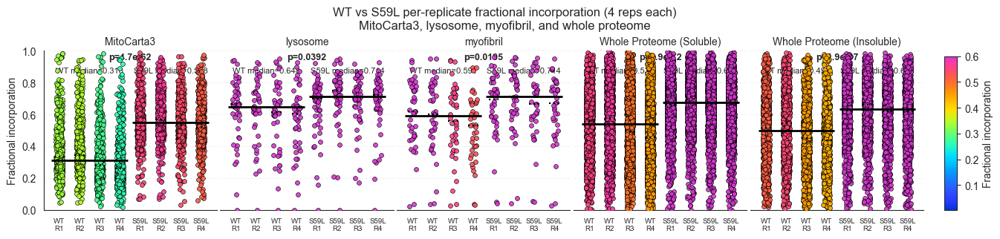


Mann–Whitney U (WT vs S59L) with FDR across panels, using protein-level medians of fractional incorporation:
                        panel      MW_U          MW_p  WT_n  S59L_n  \
0                  MitoCarta3   45465.0  1.899083e-62   477     498   
1                    lysosome    1131.0  3.921197e-02    49      60   
2                   myofibril     644.0  1.559073e-02    43      43   
3    Whole Proteome (Soluble)  934436.0  5.806881e-73  1616    1800   
4  Whole Proteome (Insoluble)  328497.0  1.167517e-37   954    1032   

         MW_FDR  
0  4.747709e-62  
1  3.921197e-02  
2  1.948842e-02  
3  2.903440e-72  
4  1.945861e-37  

Protein-level medians (median across replicates, then median across proteins):
                        panel genotype  protein_median_fi
0                  MitoCarta3     S59L           0.547584
1                  MitoCarta3       WT           0.310312
2  Whole Proteome (Insoluble)     S59L           0.632740
3  Whole Proteome (Insoluble)       WT     

In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable
from scipy import stats
from statsmodels.stats.multitest import multipletests

# ----------------------------
# USER SETTINGS
# ----------------------------
panel_specs = [
    {"label": "MitoCarta3", "filter_col": "MitoCarta3", "compartment": "Soluble"},
    {"label": "lysosome", "filter_col": "lysosome", "compartment": "Soluble"},
    {"label": "myofibril", "filter_col": "myofibril", "compartment": "Insoluble"},
    {"label": "Whole Proteome (Soluble)", "filter_col": None, "compartment": "Soluble"},
    {"label": "Whole Proteome (Insoluble)", "filter_col": None, "compartment": "Insoluble"},
]

# Color scale for fractional incorporation
CMAP_VMIN = 0.0037
CMAP_VMAX = 0.6

YMIN = 0.0
YMAX = 1.0

OUTDIR = "output"
os.makedirs(OUTDIR, exist_ok=True)

SHOW_MEDIAN_LABELS_PER_REP = False

# Tightness controls
WSPACE = 0.02
PANEL_WIDTH = 2.6
JITTER = 0.12

# ----------------------------
# Helpers
# ----------------------------
def format_p(p):
    if p is None or not np.isfinite(p):
        return "p=NA"
    if p < 1e-4:
        return f"p={p:.1e}"
    return f"p={p:.4f}"

def ratio_to_fractional_incorporation(x):
    # Ratio_ columns already store fractional incorporation: H / (H + L).
    return pd.to_numeric(x, errors="coerce")

def save_colorbar_png(
    cmap,
    norm,
    outfile="fractional_incorporation_colorbar.png",
    label="Fractional incorporation",
    figsize=(1.2, 4.5),
    dpi=300,
):
    fig, ax = plt.subplots(figsize=figsize)
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = fig.colorbar(sm, cax=ax)
    cbar.set_label(label, rotation=90)
    ax.tick_params(labelsize=9)
    plt.tight_layout()
    fig.savefig(outfile, dpi=dpi, bbox_inches="tight", transparent=True)
    plt.close(fig)

# ----------------------------
# Load data
# ----------------------------
dfgraph = pd.read_csv("output/df_after_annotation.csv")

gene_col = "Gene Symbol"
protein_col = "Accession" if "Accession" in dfgraph.columns else gene_col

# ----------------------------
# Load FIJI LUT (matplotlib cmap)
# ----------------------------
df_lut = pd.read_csv("LUT.csv")
rgb = df_lut[["Red", "Green", "Blue"]].to_numpy() / 255.0
cmap = ListedColormap(rgb, name="fiji_hsi_hue")
norm = mpl.colors.Normalize(vmin=CMAP_VMIN, vmax=CMAP_VMAX)

# ----------------------------
# Build long dataframe with BOTH genotypes + 4 replicates
# ----------------------------
rows = []

for spec in panel_specs:
    panel_label = spec["label"]
    filter_col = spec["filter_col"]
    compartment = spec["compartment"]

    tmp = dfgraph.copy()

    if filter_col is not None:
        if filter_col not in tmp.columns:
            raise KeyError(f"Missing expected annotation column: {filter_col}")
        tmp = tmp[tmp[filter_col] == True].copy()

    if tmp.empty:
        print(f"no data for {panel_label}")
        continue

    for geno in ["WT", "S59L"]:
        for rep in range(1, 5):
            ratio_col = f"Ratio_{compartment}_{geno}_{rep}"
            needed = [ratio_col, gene_col, protein_col]
            missing = [c for c in needed if c not in tmp.columns]
            if missing:
                raise KeyError(
                    f"Missing expected columns for {panel_label} / {geno} / R{rep}:\n"
                    + "\n".join(missing)
                )

            t = tmp[[gene_col, protein_col]].copy()
            t["panel"] = panel_label
            t["genotype"] = geno
            t["replicate"] = rep
            t["protein_id"] = t[protein_col].astype(str)

            # Ratio_ columns already contain fractional incorporation.
            t["fi_to_plot"] = ratio_to_fractional_incorporation(tmp[ratio_col])

            rows.append(t)

dfplot = pd.concat(rows, ignore_index=True).dropna(subset=["panel", "fi_to_plot"])

# ----------------------------
# Protein-level summaries
#   1) median across replicates for each protein
#   2) median across proteins within each panel/genotype
# ----------------------------
protein_level_df = (
    dfplot
    .groupby(["panel", "genotype", "protein_id"], as_index=False)["fi_to_plot"]
    .median()
    .rename(columns={"fi_to_plot": "protein_median_fi"})
)

panel_median_df = (
    protein_level_df
    .groupby(["panel", "genotype"], as_index=False)["protein_median_fi"]
    .median()
)

panel_median_map = {
    (r["panel"], r["genotype"]): r["protein_median_fi"]
    for _, r in panel_median_df.iterrows()
}

# ----------------------------
# MW-U + FDR per panel (WT vs S59L), using protein-level medians
# ----------------------------
mw_rows = []
for spec in panel_specs:
    panel = spec["label"]
    sub = protein_level_df[protein_level_df["panel"] == panel]

    wt = sub[sub["genotype"] == "WT"]["protein_median_fi"].dropna()
    s59l = sub[sub["genotype"] == "S59L"]["protein_median_fi"].dropna()

    if len(wt) >= 3 and len(s59l) >= 3:
        uval, p_mw = stats.mannwhitneyu(wt, s59l, alternative="two-sided")
    else:
        uval, p_mw = np.nan, np.nan

    mw_rows.append(
        {"panel": panel, "MW_U": uval, "MW_p": p_mw, "WT_n": len(wt), "S59L_n": len(s59l)}
    )

mw_df = pd.DataFrame(mw_rows)
mw_df["MW_FDR"] = np.nan
pvals = mw_df["MW_p"].to_numpy(dtype=float)
mask = np.isfinite(pvals)
if mask.any():
    mw_df.loc[mask, "MW_FDR"] = multipletests(pvals[mask], method="fdr_bh")[1]
pval_map = dict(zip(mw_df["panel"], [format_p(p) for p in mw_df["MW_FDR"]]))

# ============================================================
# FIGURE 1: per-replicate fractional incorporation clouds
# ============================================================
sns.set_style("white")

panel_order = [spec["label"] for spec in panel_specs]
n = len(panel_order)
fig, axes = plt.subplots(1, n, figsize=(PANEL_WIDTH * n + 1.1, 3.7), sharey=True)
if n == 1:
    axes = [axes]

y_pval_label = YMAX - 0.07 * (YMAX - YMIN)
y_median_label = YMAX - 0.15 * (YMAX - YMIN)

x_order = [f"WT R{r}" for r in range(1, 5)] + [f"S59L R{r}" for r in range(1, 5)]
xpos_map = {lab: i * 0.72 for i, lab in enumerate(x_order)}
x_ticks = [xpos_map[x] for x in x_order]

for idx, (ax, panel) in enumerate(zip(axes, panel_order)):
    subg = dfplot[dfplot["panel"] == panel].copy()
    subg["xcat"] = subg.apply(lambda r: f"{r['genotype']} R{int(r['replicate'])}", axis=1)
    subg["xpos"] = subg["xcat"].map(xpos_map).astype(float)

    med_by_xcat = subg.groupby("xcat")["fi_to_plot"].median()
    color_by_xcat = {k: cmap(norm(v)) for k, v in med_by_xcat.items() if np.isfinite(v)}

    rng = np.random.default_rng(0)

    for xlab in x_order:
        x0 = xpos_map[xlab]
        vals = subg.loc[subg["xcat"] == xlab, "fi_to_plot"].to_numpy(dtype=float)
        vals = vals[np.isfinite(vals)]
        if len(vals) == 0:
            continue
        jitter = rng.uniform(-JITTER, JITTER, size=len(vals))
        ax.scatter(
            np.full_like(vals, x0, dtype=float) + jitter,
            vals,
            s=18,
            marker="o",
            linewidths=0.5,
            edgecolors="black",
            alpha=0.9,
            color=color_by_xcat.get(xlab, "gray"),
            zorder=5,
        )

    for xlab in x_order:
        x0 = xpos_map[xlab]
        vals = subg.loc[subg["xcat"] == xlab, "fi_to_plot"].to_numpy(dtype=float)
        vals = vals[np.isfinite(vals)]
        if len(vals) == 0:
            continue
        med_val = np.median(vals)
        ax.hlines(
            med_val,
            x0 - 0.18,
            x0 + 0.18,
            colors="k",
            linestyles=":",
            linewidth=1.6,
            zorder=25
        )

    med_wt = panel_median_map.get((panel, "WT"), np.nan)
    med_mut = panel_median_map.get((panel, "S59L"), np.nan)

    if np.isfinite(med_wt):
        ax.hlines(
            med_wt,
            xpos_map[x_order[0]] - 0.28,
            xpos_map[x_order[3]] + 0.28,
            colors="k",
            linewidth=2,
            zorder=30,
        )
        ax.text(
            (xpos_map[x_order[0]] + xpos_map[x_order[3]]) / 2,
            y_median_label,
            f"WT median={med_wt:.3f}",
            ha="center",
            va="bottom",
            fontsize=8,
            clip_on=False,
        )

    if np.isfinite(med_mut):
        ax.hlines(
            med_mut,
            xpos_map[x_order[4]] - 0.28,
            xpos_map[x_order[7]] + 0.28,
            colors="k",
            linewidth=2,
            zorder=30,
        )
        ax.text(
            (xpos_map[x_order[4]] + xpos_map[x_order[7]]) / 2,
            y_median_label,
            f"S59L median={med_mut:.3f}",
            ha="center",
            va="bottom",
            fontsize=8,
            clip_on=False,
        )

    ax.text(
        (xpos_map[x_order[0]] + xpos_map[x_order[7]]) / 2,
        y_pval_label,
        pval_map.get(panel, "p=NA"),
        ha="center",
        va="bottom",
        fontsize=9,
        fontweight="bold",
        clip_on=False,
    )

    if SHOW_MEDIAN_LABELS_PER_REP:
        for xlab in x_order:
            med = med_by_xcat.get(xlab, np.nan)
            if np.isfinite(med):
                ax.text(
                    xpos_map[xlab],
                    YMAX - 0.23 * (YMAX - YMIN),
                    f"med={med:.3f}",
                    ha="center",
                    va="bottom",
                    fontsize=6.5,
                    clip_on=False,
                )

    ax.set_ylim(YMIN, YMAX)
    ax.set_title(panel, fontsize=10, pad=6)
    ax.set_xlabel("")
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(
        ["WT\nR1", "WT\nR2", "WT\nR3", "WT\nR4", "S59L\nR1", "S59L\nR2", "S59L\nR3", "S59L\nR4"],
        fontsize=7,
    )
    ax.grid(True, axis="y", linestyle="--", alpha=0.25)
    ax.grid(False, axis="x")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    if idx != 0:
        ax.set_ylabel("")
        ax.tick_params(axis="y", left=False, labelleft=False)
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Fractional incorporation")

sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig.subplots_adjust(left=0.06, right=0.90, top=0.82, bottom=0.24, wspace=WSPACE)

cax = fig.add_axes([0.92, 0.24, 0.012, 0.56])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Fractional incorporation", rotation=90)

fig.suptitle(
    "WT vs S59L per-replicate fractional incorporation (4 reps each)\n"
    "MitoCarta3, lysosome, myofibril, and whole proteome",
    y=0.98
)

fig.savefig(os.path.join(OUTDIR, "Replicate_clouds_byGroup_horizontal_tight_fractional_incorporation.pdf"), dpi=300)
fig.savefig(os.path.join(OUTDIR, "Replicate_clouds_byGroup_horizontal_tight_fractional_incorporation.png"), dpi=300)

save_colorbar_png(
    cmap=cmap,
    norm=norm,
    outfile=os.path.join(OUTDIR, "fractional_incorporation_colorbar_fiji_hsi.png"),
    label="Fractional incorporation",
)

plt.show()

print("\nMann–Whitney U (WT vs S59L) with FDR across panels, using protein-level medians of fractional incorporation:")
print(mw_df)

print("\nProtein-level medians (median across replicates, then median across proteins):")
print(panel_median_df)

# ============================================================
# FIGURE 3:
# Sample-level median FI values by category
#
# One point = one biological replicate median
# Compare WT vs S59L within each category
# WT appears before S59L
# LUT coloring matches the other figure
# ============================================================

def star_label(p):
    if p is None or not np.isfinite(p):
        return "ns"
    if p < 0.0001:
        return "****"
    if p < 0.001:
        return "***"
    if p < 0.01:
        return "**"
    if p < 0.05:
        return "*"
    return "ns"

sample_rows = []

panel_specs = [
    {"label": "Whole Proteome (Soluble)", "filter_col": None, "compartment": "Soluble"},
    {"label": "Whole Proteome (Insoluble)", "filter_col": None, "compartment": "Insoluble"},
    {"label": "MitoCarta3", "filter_col": "MitoCarta3", "compartment": "Soluble"},
    {"label": "myofibril", "filter_col": "myofibril", "compartment": "Insoluble"},
    {"label": "lysosome", "filter_col": "lysosome", "compartment": "Soluble"},
]

panel_order = [spec["label"] for spec in panel_specs]

for spec in panel_specs:
    panel = spec["label"]
    filter_col = spec["filter_col"]
    compartment = spec["compartment"]

    tmp = dfgraph.copy()

    if filter_col is not None:
        if filter_col not in tmp.columns:
            raise KeyError(f"Missing expected annotation column: {filter_col}")
        tmp = tmp[tmp[filter_col] == True].copy()

    if tmp.empty:
        continue

    for geno in ["WT", "S59L"]:
        for rep in range(1, 5):
            ratio_col = f"Ratio_{compartment}_{geno}_{rep}"

            if ratio_col not in tmp.columns:
                continue

            vals = ratio_to_fractional_incorporation(tmp[ratio_col]).to_numpy(dtype=float)
            vals = vals[np.isfinite(vals)]

            if len(vals) == 0:
                continue

            sample_rows.append({
                "panel": panel,
                "genotype": geno,
                "replicate": rep,
                "sample_label": f"{geno} R{rep}",
                "sample_median_fi": np.median(vals)
            })

sample_df = pd.DataFrame(sample_rows)

# ----------------------------
# Statistics on sample medians
# ----------------------------
sample_stats_rows = []

for panel in panel_order:
    sub = sample_df[sample_df["panel"] == panel]

    wt = sub[sub["genotype"] == "WT"]["sample_median_fi"].dropna().to_numpy(dtype=float)
    s59l = sub[sub["genotype"] == "S59L"]["sample_median_fi"].dropna().to_numpy(dtype=float)

    if len(wt) >= 2 and len(s59l) >= 2:
        uval, pval = stats.mannwhitneyu(wt, s59l, alternative="two-sided")
    else:
        uval, pval = np.nan, np.nan

    sample_stats_rows.append({
        "panel": panel,
        "MW_U": uval,
        "pval": pval,
        "WT_n": len(wt),
        "S59L_n": len(s59l),
        "WT_median": np.nanmedian(wt) if len(wt) else np.nan,
        "S59L_median": np.nanmedian(s59l) if len(s59l) else np.nan,
    })

sample_stats_df = pd.DataFrame(sample_stats_rows)

sample_stats_df["FDR"] = np.nan
mask = np.isfinite(sample_stats_df["pval"])
if mask.any():
    sample_stats_df.loc[mask, "FDR"] = multipletests(
        sample_stats_df.loc[mask, "pval"],
        method="fdr_bh"
    )[1]

sample_p_map = dict(zip(
    sample_stats_df["panel"],
    [format_p(p) for p in sample_stats_df["FDR"]]
))


C:\Users\narendradp\AppData\Local\Temp\ipykernel_46152\284066275.py:67: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = heatmap_df.applymap(lambda x: "" if pd.isna(x) else f"{x:.2f}")


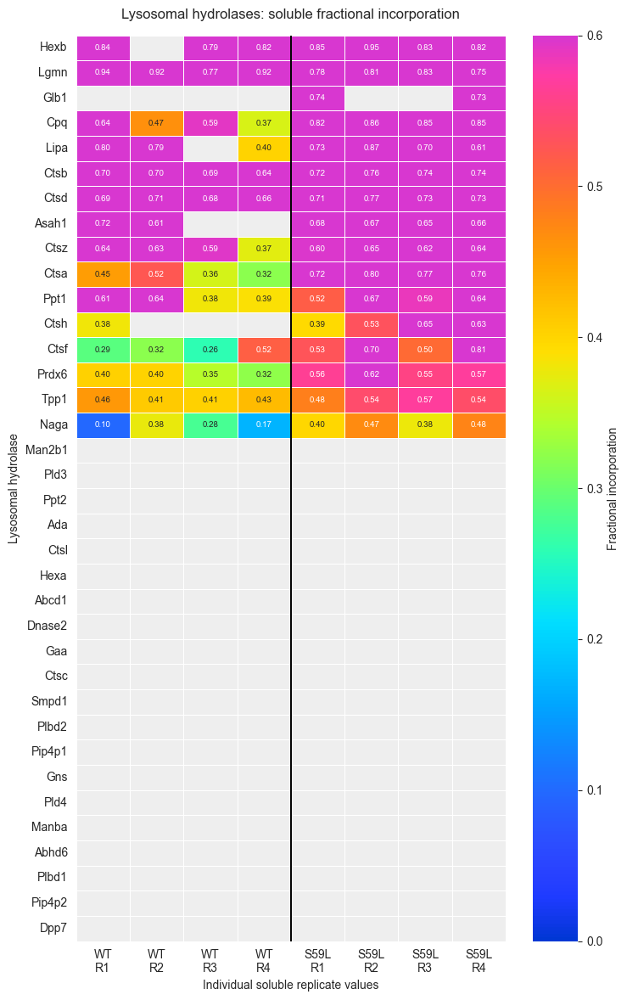

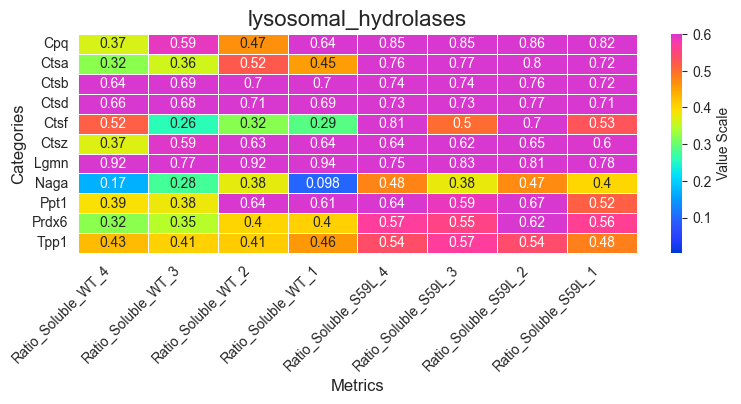

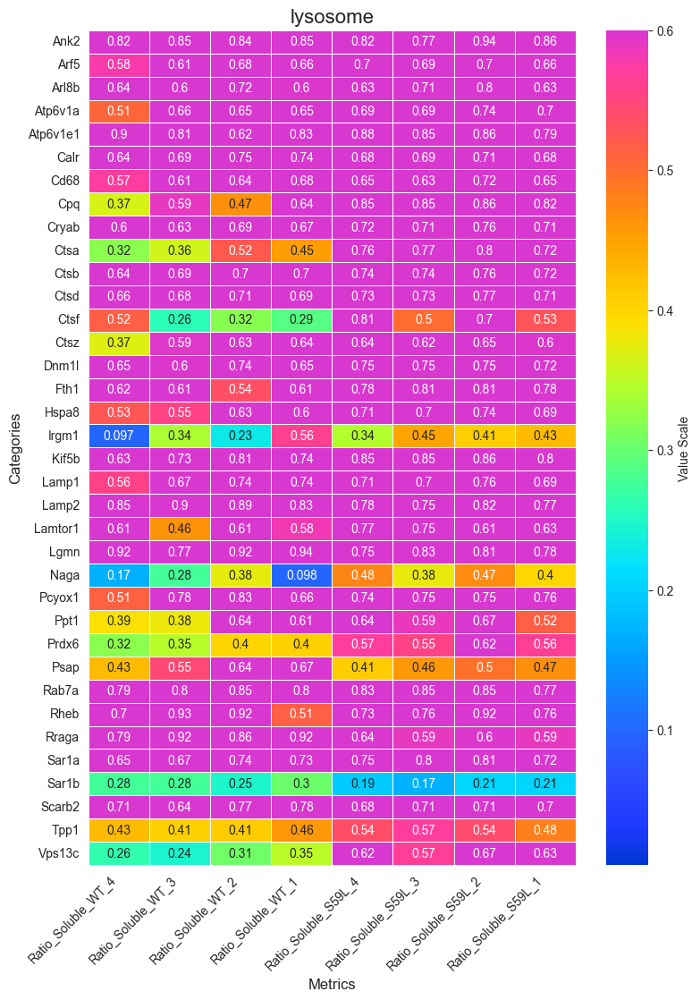

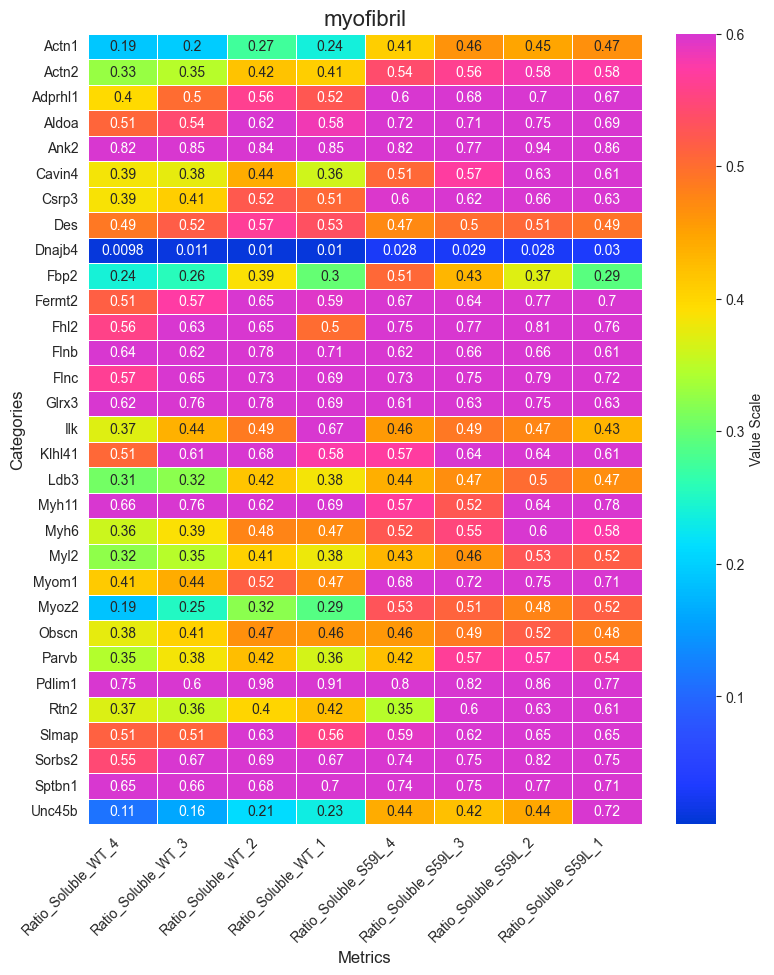

C:\Users\narendradp\AppData\Local\Temp\ipykernel_46152\284066275.py:154: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout() # Adjusts plot to prevent labels overlapping


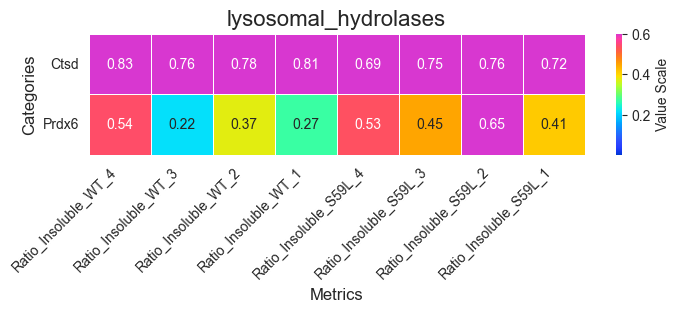

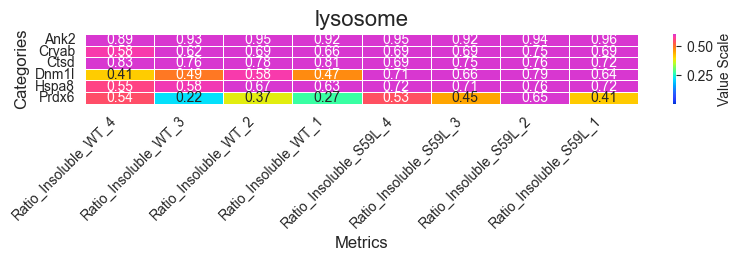

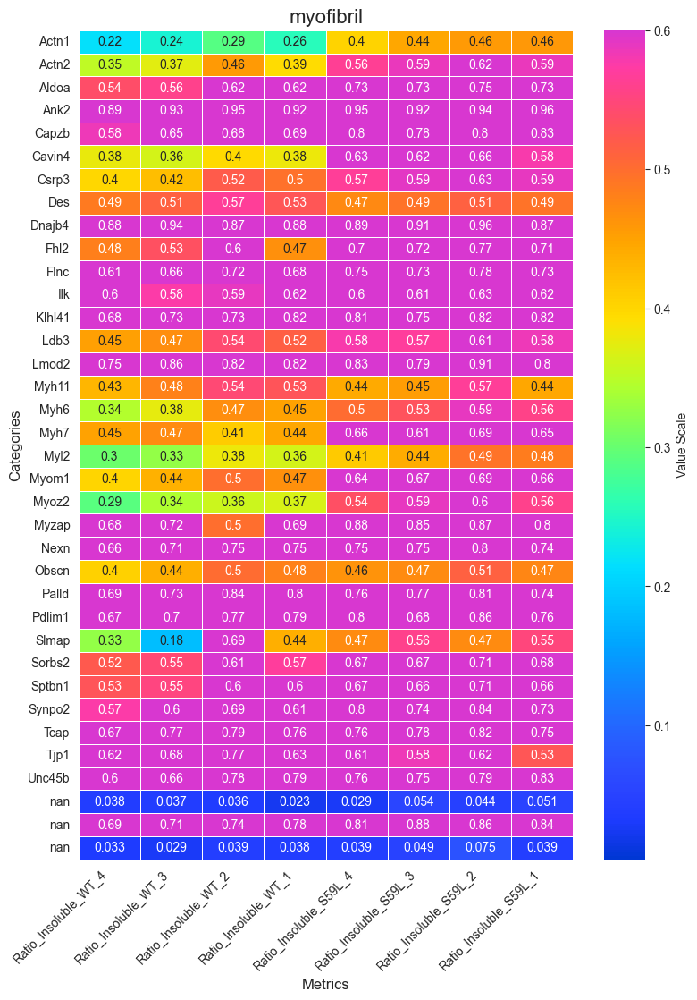

In [5]:
# ============================================================
# HEATMAP: lysosomal hydrolase soluble FI values
# ============================================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

HEATMAP_VMIN = 0.0
HEATMAP_VMAX = 0.6

OUTDIR = Path("output")
OUTDIR.mkdir(parents=True, exist_ok=True)

def _mask_true(series):
    if pd.api.types.is_bool_dtype(series):
        return series.fillna(False)
    if pd.api.types.is_numeric_dtype(series):
        return series.fillna(0).ne(0)
    return series.astype("string").str.strip().str.lower().isin(
        {"true", "t", "yes", "y", "1"}
    ).fillna(False)

def _ratio_to_fi(x):
    # Ratio_ columns already store fractional incorporation: H / (H + L).
    return pd.to_numeric(x, errors="coerce")

# Load LUT.csv cmap if needed
if "cmap" not in globals():
    lut = pd.read_csv("LUT.csv")
    rgb = lut[["Red", "Green", "Blue"]].to_numpy() / 255.0
    cmap = ListedColormap(rgb, name="fiji_hsi_hue")

heatmap_cmap = cmap.copy()
heatmap_cmap.set_bad(color="#eeeeee")

# Keep only lysosomal hydrolases
hydro = dfgraph.loc[_mask_true(dfgraph["lysosomal_hydrolases"])].copy()

# Row labels
gene_col = "Gene Symbol"
protein_col = "Accession" if "Accession" in hydro.columns else gene_col
row_labels = hydro[gene_col].astype("string").fillna(hydro[protein_col].astype("string"))

# Build matrix: individual soluble values grouped WT then S59L
heatmap_df = pd.DataFrame(index=row_labels)

for geno in ["WT", "S59L"]:
    for rep in range(1, 5):
        ratio_col = f"Ratio_Soluble_{geno}_{rep}"
        heatmap_df[f"{geno} R{rep}"] = _ratio_to_fi(hydro[ratio_col]).to_numpy(dtype=float)

heatmap_df.index.name = "Lysosomal hydrolase"

# Order rows highest to lowest by row median
heatmap_df = (
    heatmap_df
    .assign(_row_median=heatmap_df.median(axis=1, skipna=True))
    .sort_values("_row_median", ascending=False, na_position="last")
    .drop(columns="_row_median")
)

# Text labels in each box
annot = heatmap_df.applymap(lambda x: "" if pd.isna(x) else f"{x:.2f}")

# Plot
fig_height = max(7, 0.28 * len(heatmap_df) + 1.8)
fig, ax = plt.subplots(figsize=(7.5, fig_height))

sns.heatmap(
    heatmap_df,
    ax=ax,
    cmap=heatmap_cmap,
    vmin=HEATMAP_VMIN,
    vmax=HEATMAP_VMAX,
    mask=heatmap_df.isna(),
    annot=annot,
    fmt="",
    annot_kws={"fontsize": 7},
    linewidths=0.4,
    linecolor="white",
    cbar_kws={
        "label": "Fractional incorporation",
        "ticks": np.arange(0.0, 0.61, 0.1),
    },
)

# Divider between WT and S59L groups
ax.axvline(4, color="black", linewidth=1.4)

ax.set_title("Lysosomal hydrolases: soluble fractional incorporation", pad=14)
ax.set_xlabel("Individual soluble replicate values")
ax.set_ylabel("Lysosomal hydrolase")
ax.set_xticklabels([x.replace(" ", "\n") for x in heatmap_df.columns], rotation=0)

plt.tight_layout()

heatmap_df.to_csv(OUTDIR / "lysosomal_hydrolases_soluble_fi_heatmap_values.csv")
fig.savefig(OUTDIR / "lysosomal_hydrolases_soluble_fi_heatmap.png", dpi=300, bbox_inches="tight")

plt.show()



#This changes the fonts in matplotlib .pdf outputs to be compatible with abdobe illustrator
mpl.rcParams['pdf.fonttype'] = 42

df_annotate = pd.read_csv('output/df_after_annotation.csv')

groups = ['Soluble', 'Insoluble']

cats = ['lysosomal_hydrolases', 'lysosome', 'myofibril']

#group = groups[0]

for group in groups:

        ratio_datacols.sort(reverse=True)

        for cat in cats:
              
            data = df_annotate[df_annotate[f'{cat}'] == True].set_index('Gene Symbol')[ratio_datacols].filter(regex=f'{group}').dropna().sort_values(by='Gene Symbol')

            if data.shape[0] != 0:
        
                num = len(data.index)

                # Create a figure and axes for better control
                fig, ax = plt.subplots(figsize=(8, (num/3.5)+1)) # Set figure size for better readability

                # Generate the heatmap with customization
                sns.heatmap(
                    data,
                    ax=ax, # Specify the axes to plot on
                    annot=True, # Show values in cells
                    cmap="fiji_hsi_hue", # Cool-to-warm color map (e.g., 'viridis', 'crest', 'YlGnBu')
                    linewidths=.5, # Add lines between cells
                    linecolor='white', # Color of the lines
                    cbar_kws={'label': 'Value Scale'}, # Customize color bar label,
                    vmin=0.0037/1.0037, vmax=0.6
                )

                # Customize title and labels
                ax.set_title(f'{cat}', fontsize=16)
                ax.set_xlabel('Metrics', fontsize=12)
                ax.set_ylabel('Categories', fontsize=12)
                plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better fit
                plt.yticks(rotation=0) # Keep y-axis labels horizontal

                # Adjust layout and show plot
                plt.tight_layout() # Adjusts plot to prevent labels overlapping
                plt.savefig(f'output/{cat}_{group}_heavy_fract_incorp_heatmap.pdf', dpi=300)
                plt.show()

            else: print(f'no data for {group} {cat}')




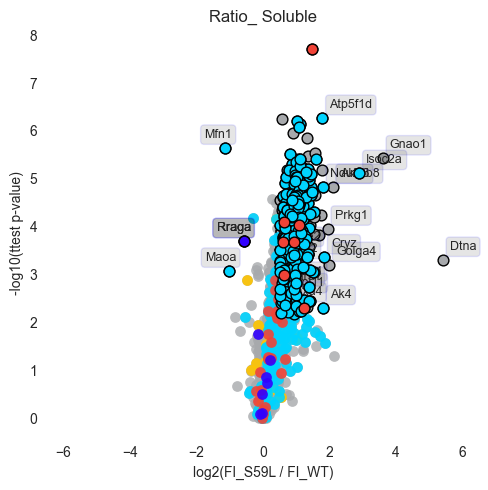

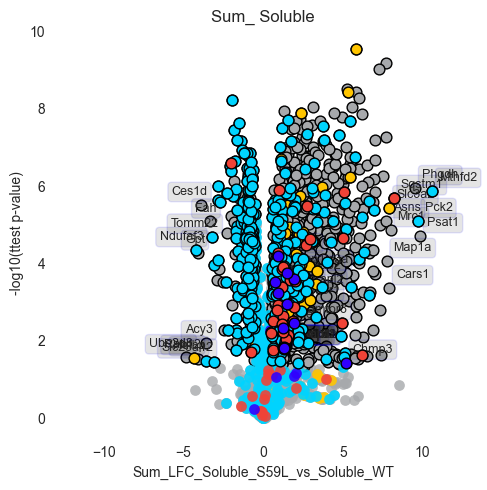

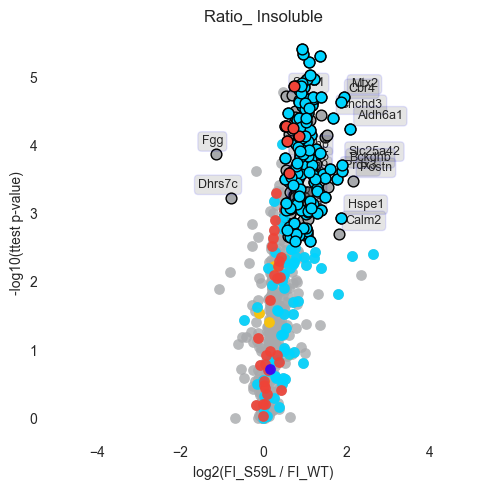

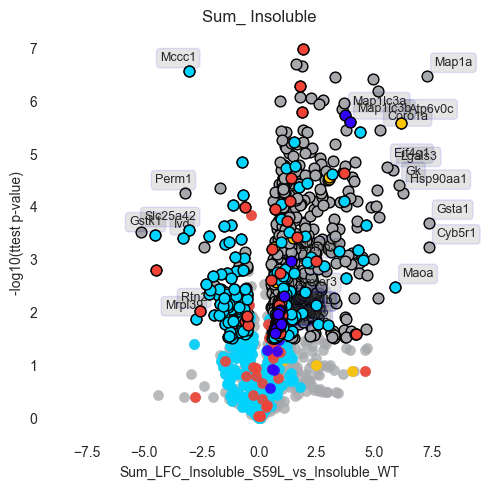

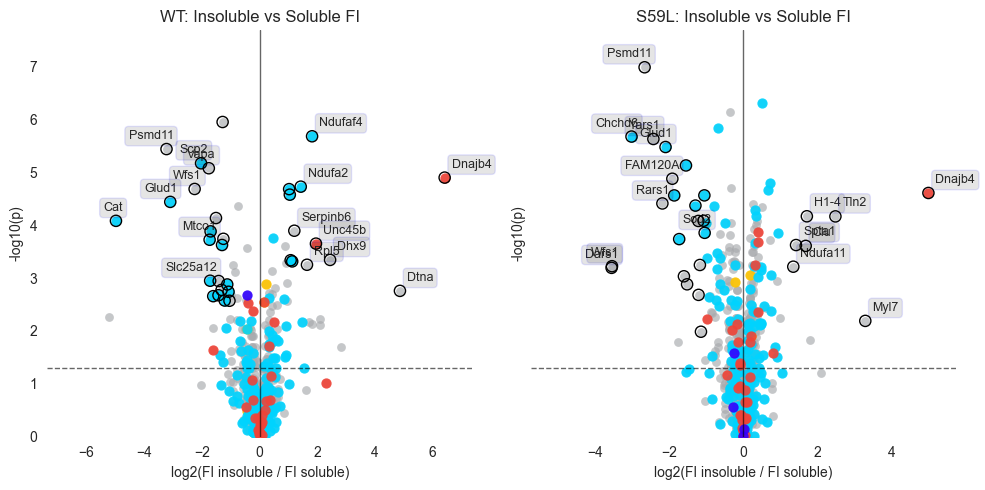

Switch-sign proteins highlighted in the final SUM plots: 200
['Arfgef2', 'Ubr4', 'Itih4', 'Fga', 'Tns1', 'Abcc4', 'Pi4ka', 'QNG1', 'Mttp', 'Dctn1', 'Psmb1', 'Gclm', 'Kpna4', 'Nudc', 'Aox1', 'Pakap', 'Copb2', 'Epb41l2', 'Vamp8', 'Aoc3', 'Stx7', 'Klc1', 'Klc2', 'Aprt', 'Apoe', 'Gsta2', 'Slc3a2', 'Ap2a2', 'Hspa1b', 'Mthfd2', 'Capg', 'Nfkb1', 'Celf1', 'Ftl1', 'Dpep1', 'Fah', 'Cd63', 'Fkbp2', 'Brcc3', 'Tbca', 'Ctsh', 'Tspo', 'Upp1', 'Rida', 'Rabggtb', 'Rad23b', 'Cox17', 'Tm9sf2', 'Mrps6', 'Acot8', 'Rab5b', 'Rpl27', 'Fbxo40', 'Tuba1c', 'Rock2', 'Stx4', 'Cbx1', 'Rhog', 'Anpep', 'Gclc', 'Rbp1', 'Cd163', 'Cyb5r2', 'Faf2', 'Uap1l1', 'Esyt1', 'Limch1', 'Sec31a', 'Them4', 'Plch1', 'Odr4', 'Pter', 'Asns', 'Nt5e', 'Hp', 'Phgdh', 'Mrc1', 'Pon2', 'Ostf1', 'Cstb', 'Fkbp3', 'Sqstm1', 'FAM120A', 'Eif4g1', 'Nudt16', 'Ckmt2', 'Mlec', 'Syne1', 'Ostc', 'Ccdc93', 'Ahcyl1', 'Pgrmc2', 'Thnsl2', 'Cpped1', 'Lpp', 'Erlin2', 'Enoph1', 'Pck2', 'Sephs1', 'Ano10', 'Ganab', 'Comtd1', 'Psmd5', 'Mrps35', 'Srsf7', 'Rcn2',

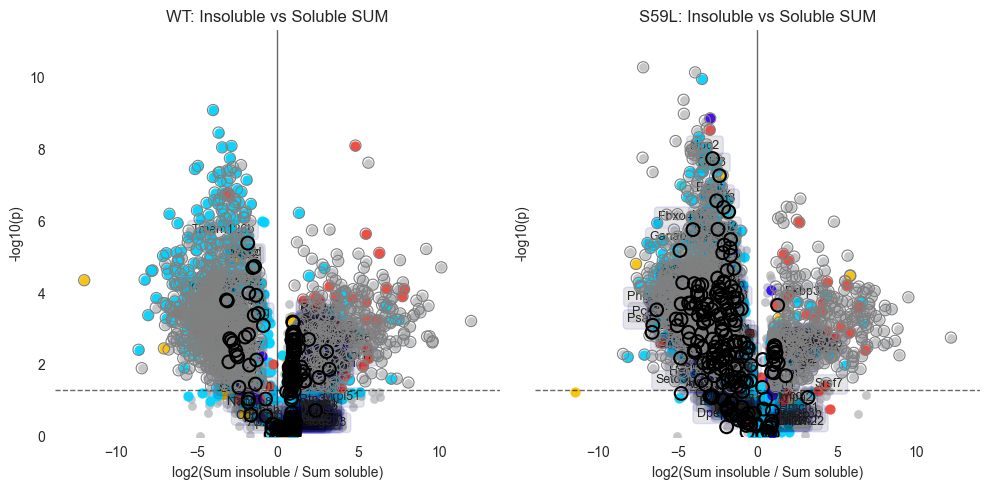

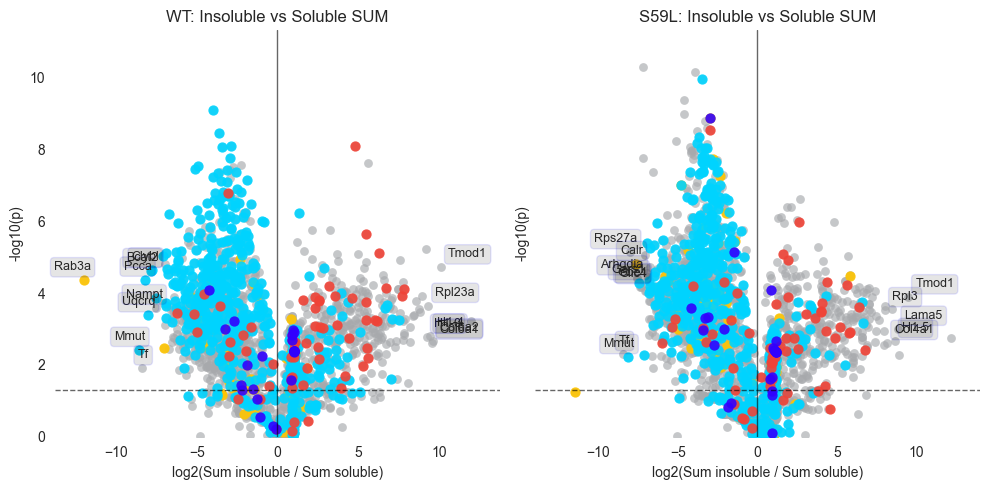

In [6]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.multitest import multipletests
from pandas.api.types import is_bool_dtype, is_numeric_dtype

#This changes the fonts in matplotlib .pdf outputs to be compatible with abdobe illustrator
mpl.rcParams['pdf.fonttype'] = 42


# ----------------------------
# Load data
# ----------------------------
df = pd.read_csv("output/df_after_annotation.csv")

comparisons = ["Soluble", "Insoluble"]
datagroups = ["Ratio_", "Sum_"]

# ----------------------------
# Helpers
# ----------------------------
def ratio_to_fi(x):
    """Return the stored fractional incorporation values as numeric data.

    Ratio_ columns were defined upstream as H / (H + L), so no additional
    ratio-to-fraction conversion is applied here.
    """
    return pd.to_numeric(x, errors="coerce")

def neglog10_p(x):
    x = pd.to_numeric(x, errors="coerce")
    x = x.clip(lower=1e-300)
    return -np.log10(x)

def label_point(x, y, val, ax, center=0.0):
    """
    Robust label helper that does not depend on index alignment.
    """
    a = pd.concat(
        [
            pd.Series(x).reset_index(drop=True),
            pd.Series(y).reset_index(drop=True),
            pd.Series(val).reset_index(drop=True),
        ],
        axis=1,
    )
    a.columns = ["x", "y", "val"]
    a = a.dropna()

    for _, point in a.iterrows():
        ha = "left" if point["x"] > center else "right"
        ax.annotate(
            point["val"],
            (point["x"], point["y"]),
            xytext=(5, 5),
            textcoords="offset points",
            ha=ha,
            va="bottom",
            bbox=dict(boxstyle="round,pad=0.3", fc="0.", ec="b", lw=1, alpha=0.1),
            fontsize=9,
        )

def safe_bool_series(df_in, colname):
    if colname not in df_in.columns:
        return pd.Series(False, index=df_in.index)
    s = df_in[colname]
    if is_bool_dtype(s):
        return s.fillna(False)
    if is_numeric_dtype(s):
        return s.fillna(0).astype(float) > 0
    s2 = s.astype(str).str.lower()
    return s2.eq("true")

def get_significance_mask(series):
    """
    Original script treated FDR columns like booleans.
    This supports either boolean flags or numeric FDR/p-value-like columns.
    """
    s = pd.Series(series)
    if is_bool_dtype(s):
        return s.fillna(False)
    if is_numeric_dtype(s):
        return pd.to_numeric(s, errors="coerce") < 0.05
    s2 = s.astype(str).str.lower()
    if s2.dropna().isin(["true", "false"]).all():
        return s2.eq("true")
    # fallback
    return s.fillna(False).astype(bool)

def compute_ratio_fi_log2fc(df_in, comparison, eps=1e-9):
    """
    Compute:
        log2(FI_S59L / FI_WT)

    where the Ratio_ columns already contain FI = H / (H + L)

    Positive values:
        higher fractional incorporation in S59L

    Negative values:
        higher fractional incorporation in WT
    """

    wt_cols = [f"Ratio_{comparison}_WT_{r}" for r in range(1, 5)]
    sl_cols = [f"Ratio_{comparison}_S59L_{r}" for r in range(1, 5)]

    missing = [c for c in wt_cols + sl_cols if c not in df_in.columns]
    if missing:
        raise KeyError(
            f"Missing expected Ratio replicate columns for {comparison}:\n"
            + "\n".join(missing)
        )

    # Use the stored fractional-incorporation values directly
    wt_fi = pd.DataFrame({
        c: ratio_to_fi(df_in[c])
        for c in wt_cols
    }).median(axis=1)

    sl_fi = pd.DataFrame({
        c: ratio_to_fi(df_in[c])
        for c in sl_cols
    }).median(axis=1)

    # log2FC direction:
    # positive = more incorporation in S59L
    return np.log2((sl_fi + eps) / (wt_fi + eps))
# ----------------------------
# Original volcano plots
# ----------------------------
for comparison in comparisons:
    for datagroup in datagroups:

        x_candidates = df.filter(regex=f"{datagroup}LFC_").filter(regex=f"{comparison}").columns.to_list()
        y_candidates = df.filter(regex=f"{datagroup}ttest_pval").filter(regex=f"{comparison}").columns.to_list()
        fdr_candidates = df.filter(regex=f"{datagroup}FDR").filter(regex=f"{comparison}").columns.to_list()

        if len(x_candidates) == 0 or len(y_candidates) == 0 or len(fdr_candidates) == 0:
            print(f"Skipping {datagroup} {comparison}: missing columns")
            continue

        xvals = x_candidates[0]
        yvals = y_candidates[0]
        fdr_col = fdr_candidates[0]

        y_all = neglog10_p(df[yvals])

        # x-axis effect size
        if datagroup == "Ratio_":
            # log2FC of the stored fractional-incorporation values
            x_effect = compute_ratio_fi_log2fc(df, comparison)
            x_label = "log2(FI_S59L / FI_WT)"
            x_center = 0.0
        else:
            x_effect = pd.to_numeric(df[xvals], errors="coerce")
            x_label = xvals
            x_center = 0.0

        sig_mask = get_significance_mask(df[fdr_col])
        dfsig = df.loc[(x_effect.abs() >= 0.5) & sig_mask].copy()
        dfsig["xplot"] = x_effect.loc[dfsig.index]
        dfsig["yplot"] = neglog10_p(dfsig[yvals])

        # Category subsets
        dfmito = df[safe_bool_series(df, "MitoCarta3")].copy()
        dfmitosig = dfsig[safe_bool_series(dfsig, "MitoCarta3")].copy()

        dflyso = df[safe_bool_series(df, "lysosome")].copy()
        dflysosig = dfsig[safe_bool_series(dfsig, "lysosome")].copy()

        if "Reactome Pathways" in df.columns:
            auto_mask = df["Reactome Pathways"].astype(str).str.contains("Macroautophagy", na=False)
        else:
            auto_mask = pd.Series(False, index=df.index)

        dfauto = df[auto_mask].copy()

        if "Reactome Pathways" in dfsig.columns:
            autosig_mask = dfsig["Reactome Pathways"].astype(str).str.contains("Macroautophagy", na=False)
        else:
            autosig_mask = pd.Series(False, index=dfsig.index)

        dfautosig = dfsig[autosig_mask].copy()

        dfmuscle = df[safe_bool_series(df, "myofibril")].copy()
        dfmusclesig = dfsig[safe_bool_series(dfsig, "myofibril")].copy()

        # x-values for category subsets
        if datagroup == "Ratio_":
            mito_x = x_effect.loc[dfmito.index]
            mitosig_x = x_effect.loc[dfmitosig.index]

            lyso_x = x_effect.loc[dflyso.index]
            lysosig_x = x_effect.loc[dflysosig.index]

            auto_x = x_effect.loc[dfauto.index]
            autosig_x = x_effect.loc[dfautosig.index]

            muscle_x = x_effect.loc[dfmuscle.index]
            musclesig_x = x_effect.loc[dfmusclesig.index]
        else:
            mito_x = pd.to_numeric(dfmito[xvals], errors="coerce")
            mitosig_x = pd.to_numeric(dfmitosig[xvals], errors="coerce")

            lyso_x = pd.to_numeric(dflyso[xvals], errors="coerce")
            lysosig_x = pd.to_numeric(dflysosig[xvals], errors="coerce")

            auto_x = pd.to_numeric(dfauto[xvals], errors="coerce")
            autosig_x = pd.to_numeric(dfautosig[xvals], errors="coerce")

            muscle_x = pd.to_numeric(dfmuscle[xvals], errors="coerce")
            musclesig_x = pd.to_numeric(dfmusclesig[xvals], errors="coerce")

        # Plot
        sns.set_style("white")
        f, ax = plt.subplots(figsize=(5, 5))

        ax.scatter(x_effect, y_all, linewidths=0, s=60, color="#A7A9AC", alpha=0.8, zorder=1, label="All")
        ax.scatter(dfsig["xplot"] if "xplot" in dfsig.columns else x_effect.loc[dfsig.index],
                   dfsig["yplot"], linewidths=1, s=60, color="#A7A9AC", edgecolors="k", zorder=2)

        ax.scatter(lyso_x, neglog10_p(dflyso[yvals]), linewidths=0, s=60, color="#FFC500", alpha=0.9, zorder=3)
        ax.scatter(lysosig_x, neglog10_p(dflysosig[yvals]), linewidths=1, s=60, color="#FFC500", edgecolors="k", zorder=4)

        ax.scatter(mito_x, neglog10_p(dfmito[yvals]), linewidths=0, s=60, color="#00D4FF", alpha=0.9, zorder=3)
        ax.scatter(mitosig_x, neglog10_p(dfmitosig[yvals]), linewidths=1, s=60, color="#00D4FF", edgecolors="k", zorder=4)

        ax.scatter(muscle_x, neglog10_p(dfmuscle[yvals]), linewidths=0, s=60, color="#F04337", alpha=0.9, zorder=3)
        ax.scatter(musclesig_x, neglog10_p(dfmusclesig[yvals]), linewidths=1, s=60, color="#F04337", edgecolors="k", zorder=4)

        ax.scatter(auto_x, neglog10_p(dfauto[yvals]), linewidths=0, s=60, color="#3100FF", alpha=0.9, zorder=3)
        ax.scatter(autosig_x, neglog10_p(dfautosig[yvals]), linewidths=1, s=60, color="#3100FF", edgecolors="k", zorder=4)

        # Label points - top and bottom 10 significant proteins
        if not dfsig.empty:
            dfsig_sorted = dfsig.sort_values("xplot" if "xplot" in dfsig.columns else xvals)
            label_point(
                dfsig_sorted["xplot"].head(10) if "xplot" in dfsig_sorted.columns else x_effect.loc[dfsig_sorted.index].head(10),
                dfsig_sorted["yplot"].head(10),
                dfsig_sorted["Gene Symbol"].head(10),
                ax,
                center=x_center,
            )
            label_point(
                dfsig_sorted["xplot"].tail(10) if "xplot" in dfsig_sorted.columns else x_effect.loc[dfsig_sorted.index].tail(10),
                dfsig_sorted["yplot"].tail(10),
                dfsig_sorted["Gene Symbol"].tail(10),
                ax,
                center=x_center,
            )

        if not dfautosig.empty:
            dfautosig_sorted = dfautosig.sort_values("xplot" if "xplot" in dfautosig.columns else xvals)
            label_point(
                dfautosig_sorted["xplot"].head(10) if "xplot" in dfautosig_sorted.columns else x_effect.loc[dfautosig_sorted.index].head(10),
                dfautosig_sorted["yplot"].head(10),
                dfautosig_sorted["Gene Symbol"].head(10),
                ax,
                center=x_center,
            )
            label_point(
                dfautosig_sorted["xplot"].tail(10) if "xplot" in dfautosig_sorted.columns else x_effect.loc[dfautosig_sorted.index].tail(10),
                dfautosig_sorted["yplot"].tail(10),
                dfautosig_sorted["Gene Symbol"].tail(10),
                ax,
                center=x_center,
            )

        sns.despine(left=True, bottom=True)

        # Axis limits
        if datagroup == "Ratio_":

            # Symmetric limits with extra padding so points/labels are not clipped
            finite_x = x_effect[np.isfinite(x_effect)]

            if len(finite_x) > 0:
                x_max = np.nanmax(np.abs(finite_x))

                # Increase padding factor for more margin at plot edges
                pad = 1.20

                ax.set_xlim(
                    -x_max * pad,
                     x_max * pad
                )

            ax.set_xlabel("log2(FI_S59L / FI_WT)")

        else:

            # Original symmetric behavior for Sum_ plots
            x_min, x_max = ax.get_xlim()

            pad = 1.15
            lim = max(abs(x_min), abs(x_max)) * pad

            ax.set_xlim(-lim, lim)

            ax.set_xlabel(x_label)

        ax.set_ylabel("-log10(ttest p-value)")
        ax.set_title(f"{datagroup} {comparison}")
        plt.tight_layout()
        plt.savefig(f'volcano_outputs/{datagroup}_{comparison}_volcano.pdf')
        plt.show()

# ============================================================
# NEW VOLCANO PLOTS:
# Insoluble vs Soluble fractional incorporation (WT and S59L)
# x = log2(FI_insoluble / FI_soluble)
# y = -log10(Welch t-test p-value)
# ============================================================

def build_soluble_vs_insoluble_volcano(df_in, genotype):
    rows = []

    sol_cols = [f"Ratio_Soluble_{genotype}_{r}" for r in range(1, 5)]
    ins_cols = [f"Ratio_Insoluble_{genotype}_{r}" for r in range(1, 5)]

    needed = ["Gene Symbol"] + sol_cols + ins_cols
    missing = [c for c in needed if c not in df_in.columns]
    if missing:
        raise KeyError(
            f"Missing expected columns for {genotype} soluble-vs-insoluble volcano:\n"
            + "\n".join(missing)
        )

    eps = 1e-6
    reactome_present = "Reactome Pathways" in df_in.columns

    for _, row in df_in.iterrows():
        gene = row["Gene Symbol"]

        sol = ratio_to_fi(pd.Series([row[c] for c in sol_cols])).to_numpy(dtype=float)
        ins = ratio_to_fi(pd.Series([row[c] for c in ins_cols])).to_numpy(dtype=float)

        sol = sol[np.isfinite(sol)]
        ins = ins[np.isfinite(ins)]

        if len(sol) < 2 or len(ins) < 2:
            continue

        sol_med = np.nanmedian(sol)
        ins_med = np.nanmedian(ins)

        x = np.log2((ins_med + eps) / (sol_med + eps))
        stat, pval = stats.ttest_ind(ins, sol, equal_var=False, nan_policy="omit")

        rows.append({
            "Gene Symbol": gene,
            "x": x,
            "pval": pval,
            "neglog10p": -np.log10(pval) if np.isfinite(pval) and pval > 0 else np.nan,
            "MitoCarta3": bool(row["MitoCarta3"]) if "MitoCarta3" in df_in.columns else False,
            "lysosome": bool(row["lysosome"]) if "lysosome" in df_in.columns else False,
            "myofibril": bool(row["myofibril"]) if "myofibril" in df_in.columns else False,
            "Reactome Pathways": row["Reactome Pathways"] if reactome_present else "",
        })

    out = pd.DataFrame(rows)
    if out.empty:
        return out

    out["FDR"] = np.nan
    mask = np.isfinite(out["pval"])
    if mask.any():
        out.loc[mask, "FDR"] = multipletests(out.loc[mask, "pval"], method="fdr_bh")[1]

    out["sig"] = (out["FDR"] < 0.05) & (out["x"].abs() >= 1)
    return out

def plot_compartment_volcano(ax, vdf, title):
    if vdf.empty:
        ax.set_axis_off()
        return

    ax.scatter(vdf["x"], vdf["neglog10p"], s=40, color="#A7A9AC", linewidths=0, alpha=0.65, zorder=1)

    mito = vdf["MitoCarta3"] == True
    lyso = vdf["lysosome"] == True
    muscle = vdf["myofibril"] == True

    if "Reactome Pathways" in vdf.columns:
        auto = vdf["Reactome Pathways"].astype(str).str.contains("Macroautophagy", na=False)
    else:
        auto = pd.Series(False, index=vdf.index)

    ax.scatter(vdf.loc[lyso, "x"], vdf.loc[lyso, "neglog10p"], s=55, color="#FFC500", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[mito, "x"], vdf.loc[mito, "neglog10p"], s=55, color="#00D4FF", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[muscle, "x"], vdf.loc[muscle, "neglog10p"], s=55, color="#F04337", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[auto, "x"], vdf.loc[auto, "neglog10p"], s=55, color="#3100FF", linewidths=0, alpha=0.9, zorder=2)

    sig = vdf[vdf["sig"]].copy()
    if not sig.empty:
        ax.scatter(sig["x"], sig["neglog10p"], s=65, facecolors="none", edgecolors="k", linewidth=1.0, zorder=4)

        sig_sorted = sig.sort_values("x")
        label_point(sig_sorted["x"].head(8), sig_sorted["neglog10p"].head(8), sig_sorted["Gene Symbol"].head(8), ax, center=0.0)
        label_point(sig_sorted["x"].tail(8), sig_sorted["neglog10p"].tail(8), sig_sorted["Gene Symbol"].tail(8), ax, center=0.0)

    ax.axvline(0, color="black", lw=1, alpha=0.6)
    ax.axhline(-np.log10(0.05), color="black", lw=1, ls="--", alpha=0.6)

    ax.set_title(title)
    ax.set_xlabel("log2(FI insoluble / FI soluble)")
    ax.set_ylabel("-log10(p)")
    ax.grid(False)

    if not vdf["x"].dropna().empty:
        x_max = np.nanmax(np.abs(vdf["x"].to_numpy(dtype=float)))
        ax.set_xlim(-x_max * 1.15, x_max * 1.15)

    if not vdf["neglog10p"].dropna().empty:
        y_max = np.nanmax(vdf["neglog10p"].to_numpy(dtype=float))
        ax.set_ylim(0, y_max * 1.10)

df_volcano_wt = build_soluble_vs_insoluble_volcano(df, "WT")
df_volcano_s59l = build_soluble_vs_insoluble_volcano(df, "S59L")

sns.set_style("white")
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

plot_compartment_volcano(axes[0], df_volcano_wt, "WT: Insoluble vs Soluble FI")
plot_compartment_volcano(axes[1], df_volcano_s59l, "S59L: Insoluble vs Soluble FI")

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

# ============================================================
# NEW VOLCANO PLOTS:
# Insoluble vs Soluble SUM values (WT and S59L)
# ============================================================

def build_sum_soluble_vs_insoluble_volcano(df_in, genotype):
    rows = []

    sol_cols = [f"Sum_Soluble_{genotype}_{r}" for r in range(1, 5)]
    ins_cols = [f"Sum_Insoluble_{genotype}_{r}" for r in range(1, 5)]

    needed = ["Accession", "Gene Symbol"] + sol_cols + ins_cols
    missing = [c for c in needed if c not in df_in.columns]
    if missing:
        raise KeyError(
            f"Missing expected columns for {genotype} sum soluble-vs-insoluble volcano:\n"
            + "\n".join(missing)
        )

    eps = 1e-6
    reactome_present = "Reactome Pathways" in df_in.columns

    for _, row in df_in.iterrows():
        acc = row["Accession"]
        gene = row["Gene Symbol"]

        if pd.isna(acc):
            continue

        sol = pd.to_numeric(pd.Series([row[c] for c in sol_cols]), errors="coerce").to_numpy(dtype=float)
        ins = pd.to_numeric(pd.Series([row[c] for c in ins_cols]), errors="coerce").to_numpy(dtype=float)

        sol = sol[np.isfinite(sol)]
        ins = ins[np.isfinite(ins)]

        if len(sol) < 2 or len(ins) < 2:
            continue

        sol_med = np.nanmedian(sol)
        ins_med = np.nanmedian(ins)

        x = np.log2((ins_med + eps) / (sol_med + eps))
        stat, pval = stats.ttest_ind(ins, sol, equal_var=False, nan_policy="omit")

        rows.append({
            "Accession": acc,
            "Gene Symbol": gene,
            "x": x,
            "pval": pval,
            "neglog10p": -np.log10(pval) if np.isfinite(pval) and pval > 0 else np.nan,
            "MitoCarta3": bool(row["MitoCarta3"]) if "MitoCarta3" in df_in.columns else False,
            "lysosome": bool(row["lysosome"]) if "lysosome" in df_in.columns else False,
            "myofibril": bool(row["myofibril"]) if "myofibril" in df_in.columns else False,
            "Reactome Pathways": row["Reactome Pathways"] if reactome_present else "",
        })

    out = pd.DataFrame(rows)
    if out.empty:
        return out

    out = out.sort_values(["Accession", "Gene Symbol"]).drop_duplicates(subset=["Accession"], keep="first").reset_index(drop=True)

    out["FDR"] = np.nan
    mask = np.isfinite(out["pval"])
    if mask.any():
        out.loc[mask, "FDR"] = multipletests(out.loc[mask, "pval"], method="fdr_bh")[1]

    out["sig"] = (out["FDR"] < 0.05) & (out["x"].abs() >= 1)
    return out

def plot_sum_compartment_volcano(ax, vdf, title, highlight_accessions=None):
    if vdf.empty:
        ax.set_axis_off()
        return

    highlight_accessions = set() if highlight_accessions is None else set(highlight_accessions)

    ax.scatter(vdf["x"], vdf["neglog10p"], s=40, color="#A7A9AC", linewidths=0, alpha=0.65, zorder=1)

    mito = vdf["MitoCarta3"] == True
    lyso = vdf["lysosome"] == True
    muscle = vdf["myofibril"] == True

    if "Reactome Pathways" in vdf.columns:
        auto = vdf["Reactome Pathways"].astype(str).str.contains("Macroautophagy", na=False)
    else:
        auto = pd.Series(False, index=vdf.index)

    ax.scatter(vdf.loc[lyso, "x"], vdf.loc[lyso, "neglog10p"], s=55, color="#FFC500", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[mito, "x"], vdf.loc[mito, "neglog10p"], s=55, color="#00D4FF", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[muscle, "x"], vdf.loc[muscle, "neglog10p"], s=55, color="#F04337", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[auto, "x"], vdf.loc[auto, "neglog10p"], s=55, color="#3100FF", linewidths=0, alpha=0.9, zorder=2)

    # Highlight only sign-switching proteins
    if highlight_accessions:
        switch_df = vdf[vdf["Accession"].isin(highlight_accessions)].copy()
        if not switch_df.empty:
            ax.scatter(
                switch_df["x"], switch_df["neglog10p"],
                s=85, facecolors="none", edgecolors="k",
                linewidth=1.5, zorder=5,
            )
            switch_df["label"] = switch_df["Gene Symbol"].where(
                switch_df["Gene Symbol"].notna() & (switch_df["Gene Symbol"].astype(str) != ""),
                switch_df["Accession"].astype(str),
            )
            switch_df = switch_df.sort_values("x")
            label_point(switch_df["x"], switch_df["neglog10p"], switch_df["label"], ax, center=0.0)

    # optional light outline for significant points
    sig = vdf[vdf["sig"]].copy()
    if not sig.empty:
        ax.scatter(sig["x"], sig["neglog10p"], s=65, facecolors="none", edgecolors="gray", linewidth=0.8, zorder=4)

    ax.axvline(0, color="black", lw=1, alpha=0.6)
    ax.axhline(-np.log10(0.05), color="black", lw=1, ls="--", alpha=0.6)

    ax.set_title(title)
    ax.set_xlabel("log2(Sum insoluble / Sum soluble)")
    ax.set_ylabel("-log10(p)")
    ax.grid(False)

    if not vdf["x"].dropna().empty:
        x_max = np.nanmax(np.abs(vdf["x"].to_numpy(dtype=float)))
        ax.set_xlim(-x_max * 1.15, x_max * 1.15)

    if not vdf["neglog10p"].dropna().empty:
        y_max = np.nanmax(vdf["neglog10p"].to_numpy(dtype=float))
        ax.set_ylim(0, y_max * 1.10)

df_sum_volcano_wt = build_sum_soluble_vs_insoluble_volcano(df, "WT")
df_sum_volcano_s59l = build_sum_soluble_vs_insoluble_volcano(df, "S59L")

# Find proteins that switch sign across genotypes and are significant in at least one
wt_join = (
    df_sum_volcano_wt[["Accession", "Gene Symbol", "x", "sig"]]
    .rename(columns={"Gene Symbol": "Gene Symbol_WT", "x": "x_wt", "sig": "sig_wt"})
)

s59l_join = (
    df_sum_volcano_s59l[["Accession", "Gene Symbol", "x", "sig"]]
    .rename(columns={"Gene Symbol": "Gene Symbol_S59L", "x": "x_s59l", "sig": "sig_s59l"})
)

common = wt_join.merge(s59l_join, on="Accession", how="inner")

common["Gene Symbol"] = common["Gene Symbol_WT"].where(
    common["Gene Symbol_WT"].notna() & (common["Gene Symbol_WT"].astype(str) != ""),
    common["Gene Symbol_S59L"],
)

switch_mask = (
    common["x_wt"].notna()
    & common["x_s59l"].notna()
    & (common["x_wt"] * common["x_s59l"] < 0)
    & (common["sig_wt"] | common["sig_s59l"])
)

switch_accessions = common.loc[switch_mask, "Accession"].tolist()
switch_labels = common.loc[switch_mask, "Gene Symbol"].tolist()

print(f"Switch-sign proteins highlighted in the final SUM plots: {len(switch_accessions)}")
print(switch_labels)

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

plot_sum_compartment_volcano(
    axes[0],
    df_sum_volcano_wt,
    "WT: Insoluble vs Soluble SUM",
    highlight_accessions=switch_accessions,
)

plot_sum_compartment_volcano(
    axes[1],
    df_sum_volcano_s59l,
    "S59L: Insoluble vs Soluble SUM",
    highlight_accessions=switch_accessions,
)

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

# ============================================================
# NEW VOLCANO PLOTS:
# Insoluble vs Soluble SUM values
# separate panels for WT and S59L
# x = log2(median Sum_insoluble / median Sum_soluble)
# y = -log10(Welch t-test p-value)
# ============================================================

def build_sum_soluble_vs_insoluble_volcano(df_in, genotype):
    rows = []

    sol_cols = [f"Sum_Soluble_{genotype}_{r}" for r in range(1, 5)]
    ins_cols = [f"Sum_Insoluble_{genotype}_{r}" for r in range(1, 5)]

    needed = ["Gene Symbol"] + sol_cols + ins_cols
    missing = [c for c in needed if c not in df_in.columns]
    if missing:
        raise KeyError(
            f"Missing expected columns for {genotype} sum soluble-vs-insoluble volcano:\n"
            + "\n".join(missing)
        )

    eps = 1e-6
    reactome_present = "Reactome Pathways" in df_in.columns

    for _, row in df_in.iterrows():
        gene = row["Gene Symbol"]

        sol = pd.to_numeric(row[sol_cols], errors="coerce").to_numpy(dtype=float)
        ins = pd.to_numeric(row[ins_cols], errors="coerce").to_numpy(dtype=float)

        sol = sol[np.isfinite(sol)]
        ins = ins[np.isfinite(ins)]

        if len(sol) < 2 or len(ins) < 2:
            continue

        sol_med = np.nanmedian(sol)
        ins_med = np.nanmedian(ins)

        x = np.log2((ins_med + eps) / (sol_med + eps))
        stat, pval = stats.ttest_ind(ins, sol, equal_var=False, nan_policy="omit")

        rows.append({
            "Gene Symbol": gene,
            "x": x,
            "pval": pval,
            "neglog10p": -np.log10(pval) if np.isfinite(pval) and pval > 0 else np.nan,
            "MitoCarta3": bool(row["MitoCarta3"]) if "MitoCarta3" in df_in.columns else False,
            "lysosome": bool(row["lysosome"]) if "lysosome" in df_in.columns else False,
            "myofibril": bool(row["myofibril"]) if "myofibril" in df_in.columns else False,
            "Reactome Pathways": row["Reactome Pathways"] if reactome_present else "",
        })

    out = pd.DataFrame(rows)
    if out.empty:
        return out

    out["FDR"] = np.nan
    mask = np.isfinite(out["pval"])
    if mask.any():
        out.loc[mask, "FDR"] = multipletests(out.loc[mask, "pval"], method="fdr_bh")[1]

    out["sig"] = (out["FDR"] < 0.05) & (out["x"].abs() >= 1)
    return out

def plot_sum_compartment_volcano(ax, vdf, title):
    if vdf.empty:
        ax.set_axis_off()
        return

    ax.scatter(vdf["x"], vdf["neglog10p"], s=40, color="#A7A9AC", linewidths=0, alpha=0.65, zorder=1)

    mito = vdf["MitoCarta3"] == True
    lyso = vdf["lysosome"] == True
    muscle = vdf["myofibril"] == True

    if "Reactome Pathways" in vdf.columns:
        auto = vdf["Reactome Pathways"].astype(str).str.contains("Macroautophagy", na=False)
    else:
        auto = pd.Series(False, index=vdf.index)

    ax.scatter(vdf.loc[lyso, "x"], vdf.loc[lyso, "neglog10p"], s=55, color="#FFC500", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[mito, "x"], vdf.loc[mito, "neglog10p"], s=55, color="#00D4FF", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[muscle, "x"], vdf.loc[muscle, "neglog10p"], s=55, color="#F04337", linewidths=0, alpha=0.9, zorder=2)
    ax.scatter(vdf.loc[auto, "x"], vdf.loc[auto, "neglog10p"], s=55, color="#3100FF", linewidths=0, alpha=0.9, zorder=2)

    sig = vdf[vdf["sig"]].copy()
    if not sig.empty:
        ax.scatter(sig["x"], sig["neglog10p"], s=65, facecolors="none", edgecolors="k", linewidth=0, zorder=4)

        sig_sorted = sig.sort_values("x")
        label_point(sig_sorted["x"].head(8), sig_sorted["neglog10p"].head(8), sig_sorted["Gene Symbol"].head(8), ax, center=0.0)
        label_point(sig_sorted["x"].tail(8), sig_sorted["neglog10p"].tail(8), sig_sorted["Gene Symbol"].tail(8), ax, center=0.0)

    ax.axvline(0, color="black", lw=1, alpha=0.6)
    ax.axhline(-np.log10(0.05), color="black", lw=1, ls="--", alpha=0.6)

    ax.set_title(title)
    ax.set_xlabel("log2(Sum insoluble / Sum soluble)")
    ax.set_ylabel("-log10(p)")
    ax.grid(False)

    if not vdf["x"].dropna().empty:
        x_max = np.nanmax(np.abs(vdf["x"].to_numpy(dtype=float)))
        ax.set_xlim(-x_max * 1.15, x_max * 1.15)

    if not vdf["neglog10p"].dropna().empty:
        y_max = np.nanmax(vdf["neglog10p"].to_numpy(dtype=float))
        ax.set_ylim(0, y_max * 1.10)

df_sum_volcano_wt = build_sum_soluble_vs_insoluble_volcano(df, "WT")
df_sum_volcano_s59l = build_sum_soluble_vs_insoluble_volcano(df, "S59L")

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

plot_sum_compartment_volcano(axes[0], df_sum_volcano_wt, "WT: Insoluble vs Soluble SUM")
plot_sum_compartment_volcano(axes[1], df_sum_volcano_s59l, "S59L: Insoluble vs Soluble SUM")

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

# Optional save
# fig.savefig("output/volcano_sum_soluble_vs_insoluble_WT_S59L.pdf", dpi=300, bbox_inches="tight")

IMS proteins plotted: 14
IMS matching mode: exact


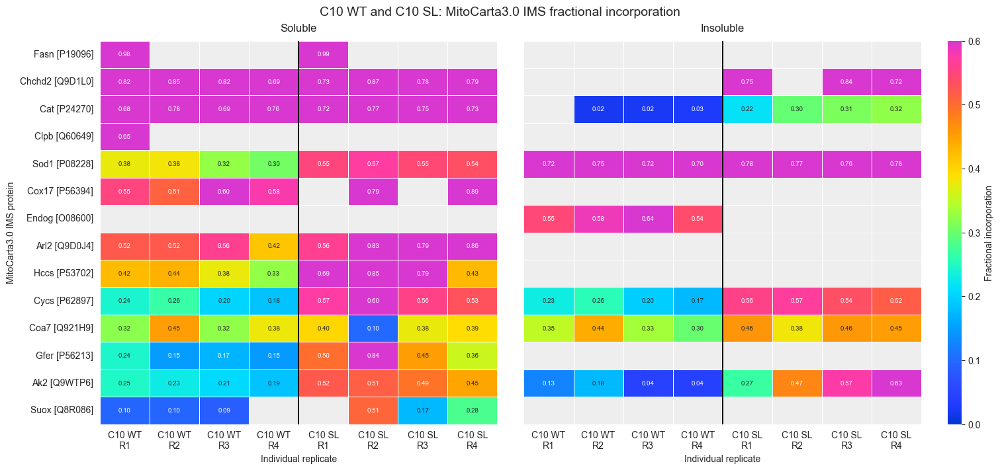

In [7]:
# ============================================================
# HEATMAPS: MitoCarta3.0 IMS proteins
# C10 WT and C10 SL, soluble and insoluble FI values
# ============================================================

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap


# ----------------------------
# Settings
# ----------------------------
HEATMAP_VMIN = 0.0
HEATMAP_VMAX = 0.6

# "exact":
#   Include only proteins whose MitoCarta3.0 localization is exactly "IMS".
#
# "contains":
#   Also include compound annotations containing IMS, such as
#   "MOM | IMS" and "Matrix|IMS".
IMS_MATCH_MODE = "exact"

OUTDIR = Path("output")
OUTDIR.mkdir(parents=True, exist_ok=True)

# Illustrator-compatible vector text
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42


def _ratio_to_fi(values):
    """
    Ratio_ columns already contain fractional incorporation:
        H / (H + L)

    Therefore, only numeric coercion is required.
    """
    return pd.to_numeric(values, errors="coerce")


# ----------------------------
# Load processed proteomics table if needed
# ----------------------------
if "dfgraph" not in globals():
    dfgraph = pd.read_csv(OUTDIR / "df_after_annotation.csv")


# ----------------------------
# Ensure the MitoCarta localization field is available
# ----------------------------
subloc_col = "MitoCarta3.0_SubMitoLocalization"

if subloc_col not in dfgraph.columns:
    mitocarta = (
        pd.read_csv(
            "Mouse.MitoCarta3.csv",
            usecols=["UniProt", subloc_col],
            dtype={
                "UniProt": "string",
                subloc_col: "string",
            },
        )
        .rename(columns={"UniProt": "Accession"})
        .dropna(subset=["Accession"])
        .drop_duplicates(subset=["Accession"], keep="first")
    )

    dfgraph = dfgraph.merge(
        mitocarta,
        on="Accession",
        how="left",
        validate="m:1",
    )


# ----------------------------
# Select IMS proteins
# ----------------------------
localization = (
    dfgraph[subloc_col]
    .astype("string")
    .fillna("")
    .str.strip()
)

if IMS_MATCH_MODE == "exact":
    ims_mask = localization.eq("IMS")

elif IMS_MATCH_MODE == "contains":
    # Matches IMS as an individual pipe-delimited localization term.
    ims_mask = localization.str.contains(
        r"(?:^|\|)\s*IMS\s*(?:\||$)",
        regex=True,
    )

else:
    raise ValueError(
        "IMS_MATCH_MODE must be either 'exact' or 'contains'."
    )

ims = dfgraph.loc[ims_mask].copy()

if ims.empty:
    raise ValueError(
        "No proteins matched the requested MitoCarta3.0 IMS localization."
    )


# ----------------------------
# Define all replicate columns
#
# The dataframe uses S59L internally. Figure labels use
# 'C10 SL' to match the requested terminology.
# ----------------------------
column_specs = {
    "Soluble": [
        (
            f"Ratio_Soluble_{genotype}_{replicate}",
            f"C10 {display_genotype}\nR{replicate}",
        )
        for genotype, display_genotype in [
            ("WT", "WT"),
            ("S59L", "SL"),
        ]
        for replicate in range(1, 5)
    ],
    "Insoluble": [
        (
            f"Ratio_Insoluble_{genotype}_{replicate}",
            f"C10 {display_genotype}\nR{replicate}",
        )
        for genotype, display_genotype in [
            ("WT", "WT"),
            ("S59L", "SL"),
        ]
        for replicate in range(1, 5)
    ],
}

required_ratio_cols = [
    source_col
    for fraction_specs in column_specs.values()
    for source_col, _ in fraction_specs
]

missing_cols = [
    col for col in required_ratio_cols
    if col not in ims.columns
]

if missing_cols:
    raise KeyError(
        "Missing expected fractional-incorporation columns:\n"
        + "\n".join(missing_cols)
    )


# ----------------------------
# Construct unique protein labels
# ----------------------------
gene = (
    ims["Gene Symbol"]
    .astype("string")
    .fillna("")
    .str.strip()
)

accession = (
    ims["Accession"]
    .astype("string")
    .fillna("")
    .str.strip()
)

ims["_heatmap_label"] = np.where(
    gene.ne("") & accession.ne(""),
    gene + " [" + accession + "]",
    gene.where(gene.ne(""), accession),
)

duplicate_labels = ims["_heatmap_label"].duplicated(keep=False)

if duplicate_labels.any():
    duplicate_values = (
        ims.loc[duplicate_labels, "_heatmap_label"]
        .astype(str)
        .unique()
        .tolist()
    )
    raise ValueError(
        "Duplicate IMS protein rows were detected for: "
        + ", ".join(duplicate_values)
    )


# ----------------------------
# Build soluble and insoluble matrices
# ----------------------------
def _build_heatmap_matrix(fraction):
    specs = column_specs[fraction]

    source_cols = [source for source, _ in specs]
    display_cols = [display for _, display in specs]

    matrix = (
        ims
        .set_index("_heatmap_label")[source_cols]
        .copy()
        .apply(_ratio_to_fi)
    )

    matrix.columns = display_cols
    matrix.index.name = "MitoCarta3.0 IMS protein"

    return matrix


soluble_df = _build_heatmap_matrix("Soluble")
insoluble_df = _build_heatmap_matrix("Insoluble")


# ----------------------------
# Apply one common row order
#
# Rows are ordered by the median across all 16 measurements,
# allowing direct visual comparison between the two panels.
# ----------------------------
all_values = pd.concat(
    [
        soluble_df.add_prefix("Soluble: "),
        insoluble_df.add_prefix("Insoluble: "),
    ],
    axis=1,
)

# Remove only proteins lacking all 16 measurements.
all_values = all_values.loc[
    all_values.notna().any(axis=1)
]

row_order = (
    all_values
    .median(axis=1, skipna=True)
    .sort_values(
        ascending=False,
        na_position="last",
    )
    .index
)

soluble_df = soluble_df.loc[row_order]
insoluble_df = insoluble_df.loc[row_order]


# ----------------------------
# Text annotations
# ----------------------------
def _annotation_matrix(matrix):
    annotations = matrix.astype(object).copy()

    for col in matrix.columns:
        annotations[col] = matrix[col].map(
            lambda value: (
                ""
                if pd.isna(value)
                else f"{value:.2f}"
            )
        )

    return annotations


soluble_annot = _annotation_matrix(soluble_df)
insoluble_annot = _annotation_matrix(insoluble_df)


# ----------------------------
# Load supplied FIJI LUT
# ----------------------------
if "cmap" not in globals():
    lut = pd.read_csv("LUT.csv")

    rgb = (
        lut[["Red", "Green", "Blue"]]
        .to_numpy(dtype=float)
        / 255.0
    )

    cmap = ListedColormap(
        rgb,
        name="fiji_hsi_hue",
    )

heatmap_cmap = cmap.copy()
heatmap_cmap.set_bad("#eeeeee")


# ----------------------------
# Plot the two heatmaps
# ----------------------------
fig_height = max(
    7.0,
    0.28 * len(row_order) + 2.2,
)

fig = plt.figure(
    figsize=(15.0, fig_height),
    constrained_layout=True,
)

grid = fig.add_gridspec(
    1,
    3,
    width_ratios=[1, 1, 0.035],
    wspace=0.08,
)

ax_soluble = fig.add_subplot(grid[0, 0])
ax_insoluble = fig.add_subplot(
    grid[0, 1],
    sharey=ax_soluble,
)
cbar_ax = fig.add_subplot(grid[0, 2])

common_heatmap_kwargs = {
    "cmap": heatmap_cmap,
    "vmin": HEATMAP_VMIN,
    "vmax": HEATMAP_VMAX,
    "linewidths": 0.4,
    "linecolor": "white",
    "fmt": "",
    "annot_kws": {"fontsize": 7},
}

sns.heatmap(
    soluble_df,
    ax=ax_soluble,
    mask=soluble_df.isna(),
    annot=soluble_annot,
    cbar=False,
    **common_heatmap_kwargs,
)

sns.heatmap(
    insoluble_df,
    ax=ax_insoluble,
    mask=insoluble_df.isna(),
    annot=insoluble_annot,
    cbar=True,
    cbar_ax=cbar_ax,
    cbar_kws={
        "label": "Fractional incorporation",
        "ticks": np.arange(0.0, 0.61, 0.1),
    },
    **common_heatmap_kwargs,
)

# Light gray denotes a missing value.
ax_soluble.set_facecolor("#eeeeee")
ax_insoluble.set_facecolor("#eeeeee")

# Divider between WT and SL replicates.
for ax in (ax_soluble, ax_insoluble):
    ax.axvline(
        4,
        color="black",
        linewidth=1.4,
    )
    ax.set_xlabel("Individual replicate")
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=0,
    )

ax_soluble.set_title(
    "Soluble",
    pad=10,
)

ax_insoluble.set_title(
    "Insoluble",
    pad=10,
)

ax_soluble.set_ylabel(
    "MitoCarta3.0 IMS protein"
)

ax_insoluble.set_ylabel("")
ax_insoluble.tick_params(
    axis="y",
    left=False,
    labelleft=False,
)

fig.suptitle(
    "C10 WT and C10 SL: "
    "MitoCarta3.0 IMS fractional incorporation",
    fontsize=14,
)


# ----------------------------
# Export values and figure
# ----------------------------
soluble_df.to_csv(
    OUTDIR
    / "mitocarta3_IMS_soluble_FI_heatmap_values.csv"
)

insoluble_df.to_csv(
    OUTDIR
    / "mitocarta3_IMS_insoluble_FI_heatmap_values.csv"
)

fig.savefig(
    OUTDIR
    / "mitocarta3_IMS_soluble_insoluble_FI_heatmaps.pdf",
    bbox_inches="tight",
)

fig.savefig(
    OUTDIR
    / "mitocarta3_IMS_soluble_insoluble_FI_heatmaps.png",
    dpi=300,
    bbox_inches="tight",
)

print(f"IMS proteins plotted: {len(row_order)}")
print(f"IMS matching mode: {IMS_MATCH_MODE}")

plt.show()

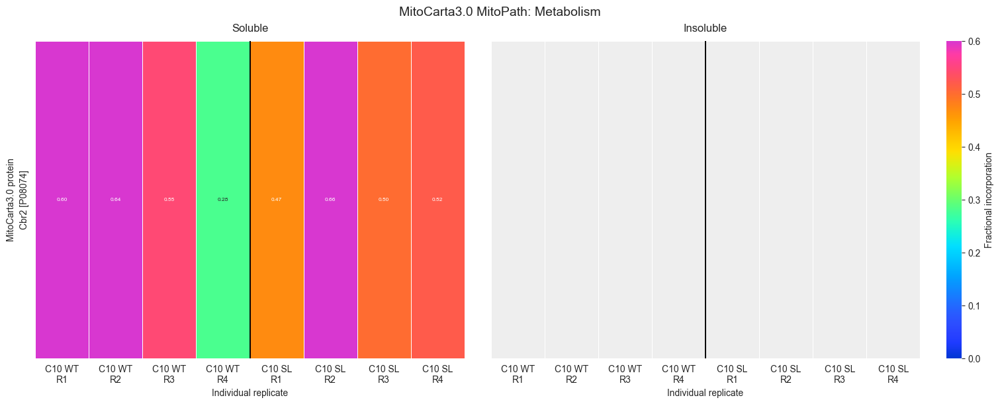

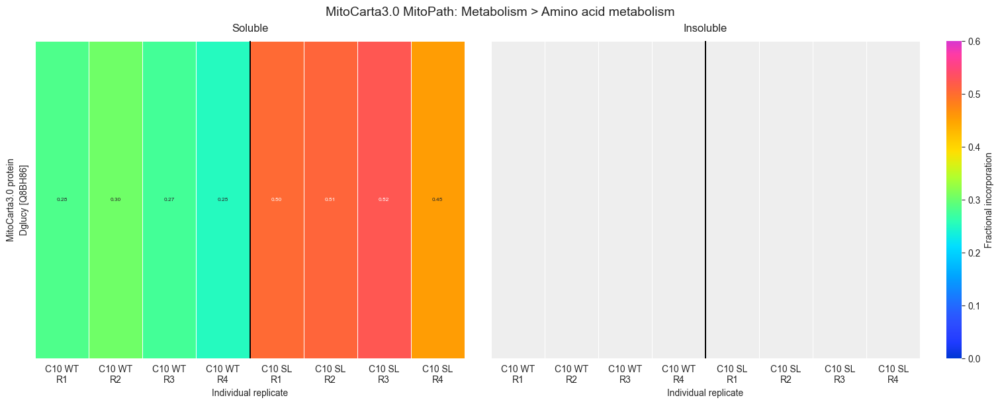

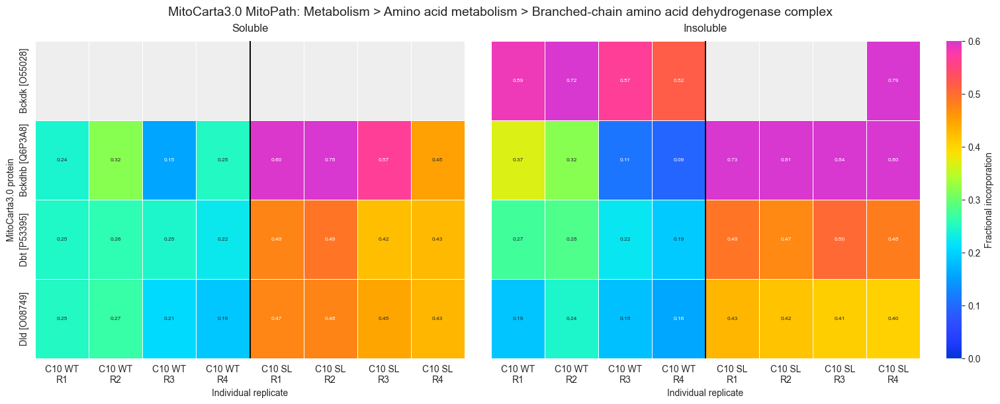

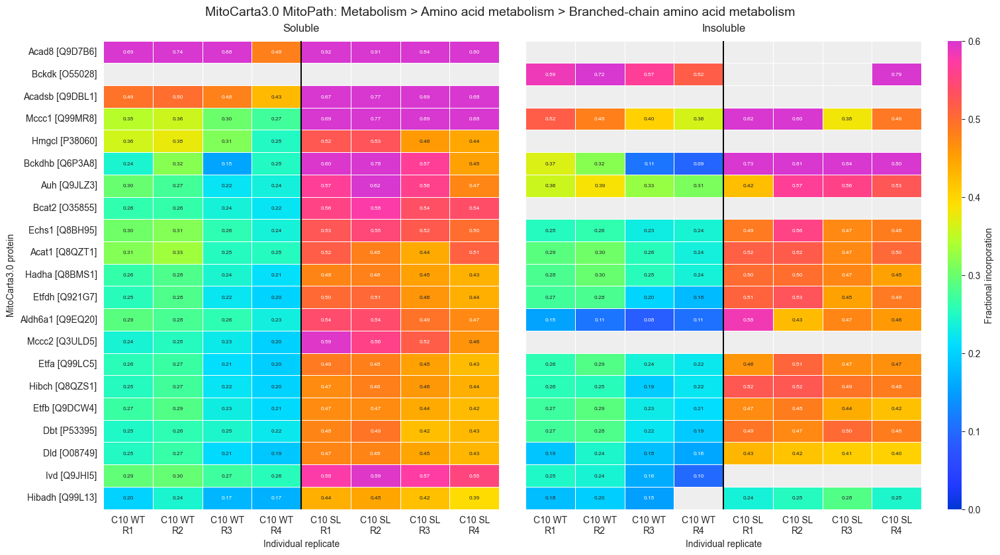

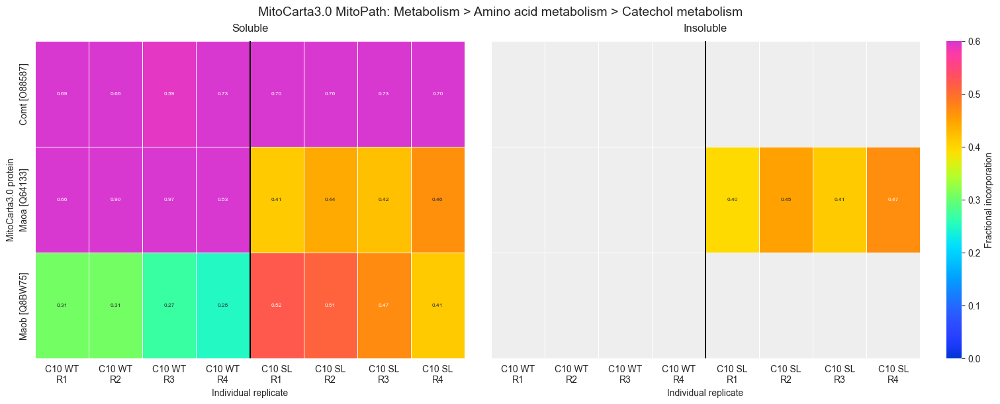

...

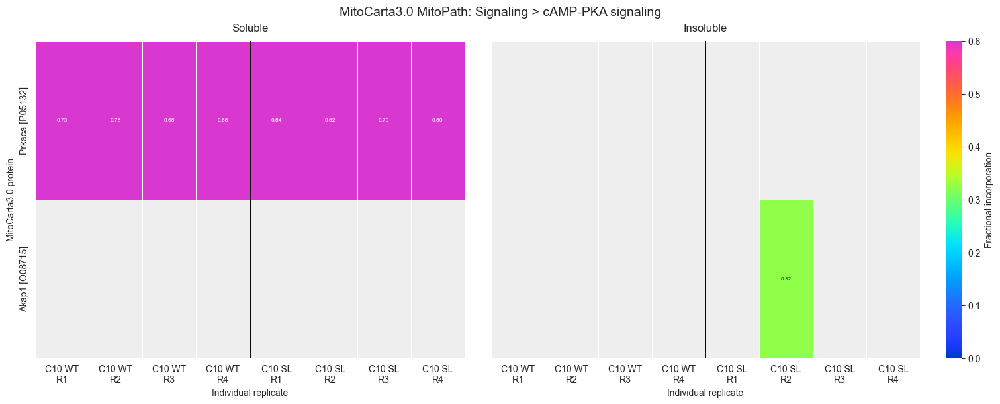

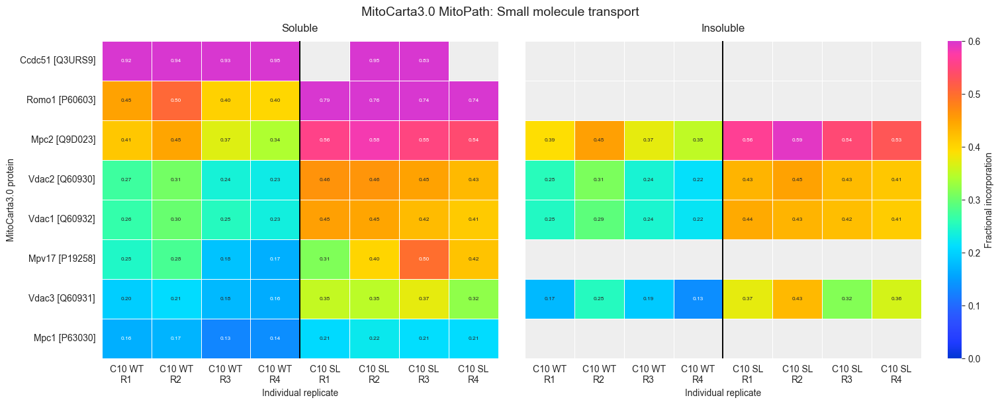

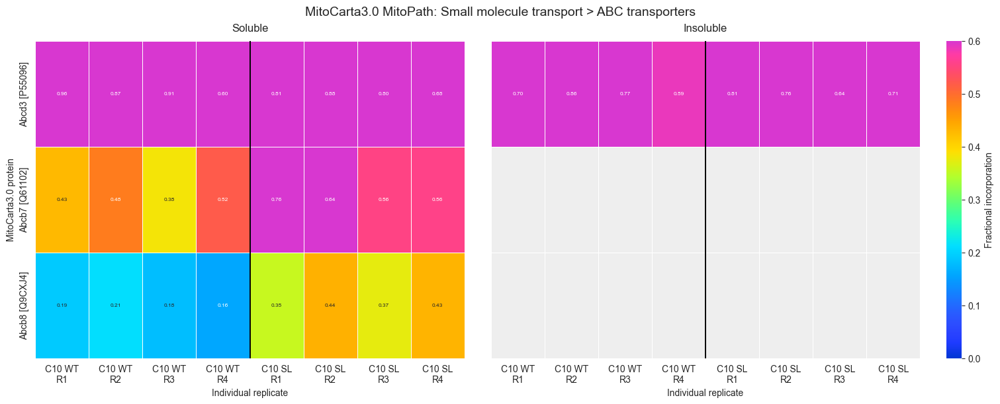

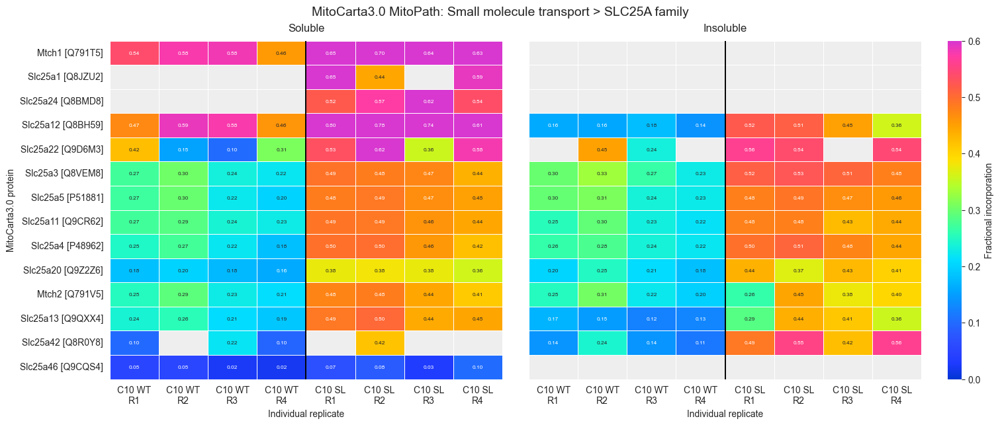

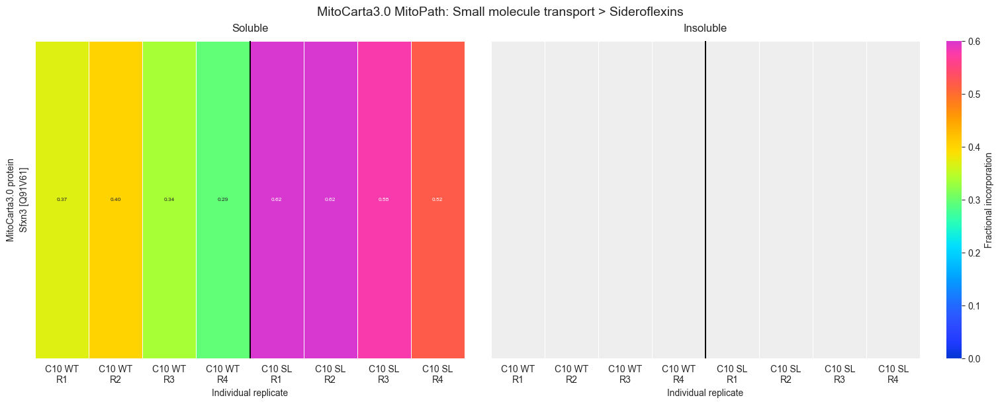

MitoPath definitions generated: 137
Combined multipage PDF: output\mitocarta3_mitopath_heatmaps\all_mitopaths_full_FI_heatmaps.pdf


,MitoPath,n_annotated_proteins,n_plotted_proteins,n_pages
0,Metabolism,1,1,1
1,Metabolism > Amino acid metabolism,1,1,1
2,Metabolism > Amino acid metabolism > Branched-...,4,4,1
3,Metabolism > Amino acid metabolism > Branched-...,21,21,1
4,Metabolism > Amino acid metabolism > Catechol ...,3,3,1
...,...,...,...,...
132,Small molecule transport,11,8,1
133,Small molecule transport > ABC transporters,7,3,1
134,Small molecule transport > Calcium uniporter,1,0,0
135,Small molecule transport > SLC25A family,24,14,1


In [8]:
# ============================================================
# HEATMAP SERIES: all MitoCarta3.0 MitoPath families
# C10 WT and C10 SL, soluble and insoluble FI values
# ============================================================

from pathlib import Path
from matplotlib.backends.backend_pdf import PdfPages
import re
import hashlib

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap


# ----------------------------
# Settings
# ----------------------------
HEATMAP_VMIN = 0.0
HEATMAP_VMAX = 0.6

# 1 = broad MitoPath family (recommended; one series for each top-level family)
# 2 = second-level pathway
# "full" = complete MitoCarta pathway string (many more heatmaps)
MITOPATH_LEVEL = "full"

# Split large pathways across multiple pages while preserving one common row order.
MAX_ROWS_PER_PAGE = 50
ANNOTATE_VALUES = True

OUTDIR = Path("output")
MITOPATH_OUTDIR = OUTDIR / "mitocarta3_mitopath_heatmaps"
MITOPATH_OUTDIR.mkdir(parents=True, exist_ok=True)

MITOCARTA_PATH = Path("Mouse.MitoCarta3.csv")
LUT_PATH = Path("LUT.csv")
PATHWAY_COL = "MitoCarta3.0_MitoPathways"

mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42


def _ratio_to_fi(values):
    """Ratio_ columns already store H / (H + L); only coerce to numeric."""
    return pd.to_numeric(values, errors="coerce")


def _pathway_memberships(value, level=1):
    """Return the unique MitoPath memberships encoded in one MitoCarta cell."""
    if pd.isna(value):
        return set()

    memberships = set()

    for raw_path in str(value).split("|"):
        raw_path = raw_path.strip()

        # MitoCarta uses 0 for entries without a named MitoPath.
        if not raw_path or raw_path == "0":
            continue

        parts = [part.strip() for part in raw_path.split(">") if part.strip()]
        if not parts:
            continue

        if level == "full":
            label = " > ".join(parts)
        else:
            n_levels = int(level)
            if n_levels < 1:
                raise ValueError("MITOPATH_LEVEL must be 1, 2, or 'full'.")
            label = " > ".join(parts[:n_levels])

        memberships.add(label)

    return memberships


def _slugify(text):
    raw = str(text)
    slug = re.sub(r"[^A-Za-z0-9]+", "_", raw).strip("_")[:100]
    digest = hashlib.sha1(raw.encode("utf-8")).hexdigest()[:8]
    return f"{slug or 'unnamed_pathway'}_{digest}"


def _annotation_matrix(matrix):
    if not ANNOTATE_VALUES:
        return False

    out = matrix.astype(object).copy()
    for col in matrix.columns:
        out[col] = matrix[col].map(
            lambda value: "" if pd.isna(value) else f"{value:.2f}"
        )
    return out


# ----------------------------
# Load processed proteomics table if needed
# ----------------------------
if "dfgraph" not in globals():
    dfgraph = pd.read_csv(OUTDIR / "df_after_annotation.csv")


# ----------------------------
# Load MitoCarta pathways and merge if needed
# ----------------------------
mitocarta = (
    pd.read_csv(
        MITOCARTA_PATH,
        usecols=["UniProt", PATHWAY_COL],
        dtype={"UniProt": "string", PATHWAY_COL: "string"},
    )
    .rename(columns={"UniProt": "Accession"})
    .dropna(subset=["Accession"])
    .drop_duplicates(subset=["Accession"], keep="first")
)

if PATHWAY_COL not in dfgraph.columns:
    dfgraph = dfgraph.merge(
        mitocarta,
        on="Accession",
        how="left",
        validate="m:1",
    )

required_id_cols = ["Accession", "Gene Symbol", PATHWAY_COL]
missing_id_cols = [col for col in required_id_cols if col not in dfgraph.columns]
if missing_id_cols:
    raise KeyError(f"Missing required columns: {missing_id_cols}")


# ----------------------------
# Replicate layout
# ----------------------------
column_specs = {
    "Soluble": [
        (f"Ratio_Soluble_{genotype}_{rep}", f"C10 {display}\nR{rep}")
        for genotype, display in [("WT", "WT"), ("S59L", "SL")]
        for rep in range(1, 5)
    ],
    "Insoluble": [
        (f"Ratio_Insoluble_{genotype}_{rep}", f"C10 {display}\nR{rep}")
        for genotype, display in [("WT", "WT"), ("S59L", "SL")]
        for rep in range(1, 5)
    ],
}

required_ratio_cols = [
    source_col
    for fraction_specs in column_specs.values()
    for source_col, _ in fraction_specs
]
missing_ratio_cols = [col for col in required_ratio_cols if col not in dfgraph.columns]
if missing_ratio_cols:
    raise KeyError(
        "Missing expected fractional-incorporation columns:\n"
        + "\n".join(missing_ratio_cols)
    )


# ----------------------------
# Derive all requested MitoPaths from the supplied reference table
# ----------------------------
all_mitopaths = sorted(
    {
        pathway
        for memberships in mitocarta[PATHWAY_COL].map(
            lambda value: _pathway_memberships(value, MITOPATH_LEVEL)
        )
        for pathway in memberships
    }
)

plot_source = dfgraph.copy()
plot_source["_mitopath_memberships"] = plot_source[PATHWAY_COL].map(
    lambda value: _pathway_memberships(value, MITOPATH_LEVEL)
)


# ----------------------------
# Load supplied FIJI LUT
# ----------------------------
if "cmap" not in globals():
    lut = pd.read_csv(LUT_PATH)
    rgb = lut[["Red", "Green", "Blue"]].to_numpy(dtype=float) / 255.0
    cmap = ListedColormap(rgb, name="fiji_hsi_hue")

heatmap_cmap = cmap.copy()
heatmap_cmap.set_bad("#eeeeee")


# ----------------------------
# Helpers for protein labels and matrices
# ----------------------------
def _prepare_pathway_rows(pathway):
    sub = plot_source.loc[
        plot_source["_mitopath_memberships"].map(lambda values: pathway in values)
    ].copy()

    gene = sub["Gene Symbol"].astype("string").fillna("").str.strip()
    accession = sub["Accession"].astype("string").fillna("").str.strip()

    sub["_heatmap_label"] = np.where(
        gene.ne("") & accession.ne(""),
        gene + " [" + accession + "]",
        gene.where(gene.ne(""), accession),
    )

    if sub["_heatmap_label"].eq("").any():
        raise ValueError(f"Blank protein label encountered in MitoPath: {pathway}")

    if sub["_heatmap_label"].duplicated().any():
        duplicated = sub.loc[
            sub["_heatmap_label"].duplicated(keep=False), "_heatmap_label"
        ].unique()
        raise ValueError(
            f"Duplicate protein rows encountered in MitoPath '{pathway}': "
            + ", ".join(map(str, duplicated))
        )

    return sub


def _build_matrix(sub, fraction):
    specs = column_specs[fraction]
    source_cols = [source for source, _ in specs]
    display_cols = [display for _, display in specs]

    matrix = (
        sub.set_index("_heatmap_label")[source_cols]
        .apply(pd.to_numeric, errors="coerce")
    )
    matrix.columns = display_cols
    matrix.index.name = "Protein"
    return matrix


def _plot_page(pathway, soluble_page, insoluble_page, page_number, total_pages):
    fig_height = max(6.0, 0.28 * len(soluble_page) + 2.4)

    fig = plt.figure(figsize=(15.0, fig_height), constrained_layout=True)
    grid = fig.add_gridspec(
        1,
        3,
        width_ratios=[1, 1, 0.035],
        wspace=0.08,
    )

    ax_soluble = fig.add_subplot(grid[0, 0])
    ax_insoluble = fig.add_subplot(grid[0, 1], sharey=ax_soluble)
    cbar_ax = fig.add_subplot(grid[0, 2])

    common_kwargs = {
        "cmap": heatmap_cmap,
        "vmin": HEATMAP_VMIN,
        "vmax": HEATMAP_VMAX,
        "linewidths": 0.4,
        "linecolor": "white",
        "fmt": "",
        "annot_kws": {"fontsize": 6},
    }

    sns.heatmap(
        soluble_page,
        ax=ax_soluble,
        mask=soluble_page.isna(),
        annot=_annotation_matrix(soluble_page),
        cbar=False,
        **common_kwargs,
    )

    sns.heatmap(
        insoluble_page,
        ax=ax_insoluble,
        mask=insoluble_page.isna(),
        annot=_annotation_matrix(insoluble_page),
        cbar=True,
        cbar_ax=cbar_ax,
        cbar_kws={
            "label": "Fractional incorporation",
            "ticks": np.arange(0.0, 0.61, 0.1),
        },
        **common_kwargs,
    )

    ax_soluble.set_facecolor("#eeeeee")
    ax_insoluble.set_facecolor("#eeeeee")

    for ax in (ax_soluble, ax_insoluble):
        ax.axvline(4, color="black", linewidth=1.4)
        ax.set_xlabel("Individual replicate")
        ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

    ax_soluble.set_title("Soluble", pad=10)
    ax_insoluble.set_title("Insoluble", pad=10)

    ax_soluble.set_ylabel("MitoCarta3.0 protein")
    ax_insoluble.set_ylabel("")
    ax_insoluble.tick_params(axis="y", left=False, labelleft=False)

    page_text = f" — page {page_number}/{total_pages}" if total_pages > 1 else ""
    fig.suptitle(
        f"MitoCarta3.0 MitoPath: {pathway}{page_text}",
        fontsize=14,
    )

    return fig


# ----------------------------
# Generate one paired heatmap series per MitoPath
# ----------------------------
level_label = "full" if MITOPATH_LEVEL == "full" else f"level_{MITOPATH_LEVEL}"
combined_pdf_path = MITOPATH_OUTDIR / f"all_mitopaths_{level_label}_FI_heatmaps.pdf"
summary_rows = []

with PdfPages(combined_pdf_path) as combined_pdf:
    for pathway in all_mitopaths:
        sub = _prepare_pathway_rows(pathway)

        soluble_df = _build_matrix(sub, "Soluble")
        insoluble_df = _build_matrix(sub, "Insoluble")

        all_values = pd.concat(
            [
                soluble_df.add_prefix("Soluble: "),
                insoluble_df.add_prefix("Insoluble: "),
            ],
            axis=1,
        )

        # Retain proteins with at least one measured FI value among the 16 cells.
        measured_mask = all_values.notna().any(axis=1)
        all_values = all_values.loc[measured_mask]
        soluble_df = soluble_df.loc[measured_mask]
        insoluble_df = insoluble_df.loc[measured_mask]

        if all_values.empty:
            summary_rows.append(
                {
                    "MitoPath": pathway,
                    "n_annotated_proteins": len(sub),
                    "n_plotted_proteins": 0,
                    "n_pages": 0,
                }
            )
            continue

        row_order = (
            all_values.median(axis=1, skipna=True)
            .sort_values(ascending=False, na_position="last")
            .index
        )

        soluble_df = soluble_df.loc[row_order]
        insoluble_df = insoluble_df.loc[row_order]

        slug = _slugify(pathway)
        soluble_df.to_csv(MITOPATH_OUTDIR / f"{slug}_soluble_FI_values.csv")
        insoluble_df.to_csv(MITOPATH_OUTDIR / f"{slug}_insoluble_FI_values.csv")

        n_pages = int(np.ceil(len(row_order) / MAX_ROWS_PER_PAGE))

        for page_idx in range(n_pages):
            start = page_idx * MAX_ROWS_PER_PAGE
            stop = min((page_idx + 1) * MAX_ROWS_PER_PAGE, len(row_order))
            page_rows = row_order[start:stop]

            fig = _plot_page(
                pathway=pathway,
                soluble_page=soluble_df.loc[page_rows],
                insoluble_page=insoluble_df.loc[page_rows],
                page_number=page_idx + 1,
                total_pages=n_pages,
            )

            combined_pdf.savefig(fig, bbox_inches="tight")
            fig.savefig(
                MITOPATH_OUTDIR / f"{slug}_page_{page_idx + 1:02d}.png",
                dpi=300,
                bbox_inches="tight",
            )
            plt.show()
            plt.close(fig)

        summary_rows.append(
            {
                "MitoPath": pathway,
                "n_annotated_proteins": len(sub),
                "n_plotted_proteins": len(row_order),
                "n_pages": n_pages,
            }
        )

summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(
    MITOPATH_OUTDIR / f"all_mitopaths_{level_label}_summary.csv",
    index=False,
)

print(f"MitoPath definitions generated: {len(all_mitopaths)}")
print(f"Combined multipage PDF: {combined_pdf_path}")
display(summary_df)
